# Подключение основных библиотек

In [150]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import ccxt
from IPython.display import clear_output, display
from dotenv import load_dotenv
import os
import tqdm
from scipy.ndimage import gaussian_filter1d

#sns.set_theme()
np.random.seed(0)
load_dotenv()
%matplotlib inline

In [151]:
import random

random.seed(0)
np.random.seed()

# Получение данных о котировке BTC/USDT c биржи OKX

## Считывание данных с биржи

In [152]:
# Биржа из которой будут браться данные с помощью CCXT
EXCHANGE = ccxt.okx()
# Инструмент в формате символа для обработки
SYMBOL = "BTC/USDT"
# Таймфрейм свеч
TIMEFRAME = "1h"

In [153]:
from_ts = EXCHANGE.parse8601('2020-01-10 00:00:00')

ohlcv_list = []
ohlcv = EXCHANGE.fetch_ohlcv(symbol=SYMBOL, timeframe=TIMEFRAME, since=from_ts, limit=100)
ohlcv_list.append(ohlcv)

while True:
    from_ts = ohlcv[-1][0]
    new_ohlcv = EXCHANGE.fetch_ohlcv(symbol=SYMBOL, timeframe=TIMEFRAME, since=from_ts, limit=100)
    ohlcv.extend(new_ohlcv)

    print(f"\r{EXCHANGE.iso8601(from_ts)}", end="")
    
    if len(new_ohlcv) <= 1:
    	break

2024-10-08T18:00:00.000Z

In [154]:
ohlcv = pd.DataFrame(ohlcv, columns=["Date", "Open", "High", "Low", "Close", "Volume"])
ohlcv["Date"] = ohlcv["Date"].apply(lambda x: datetime.datetime.fromtimestamp(x / 1000))

In [155]:
ohlcv

,Date,Open,High,Low,Close,Volume
0,2020-01-10 00:00:00,7820.1,7855.0,7820.0,7822.5,664.211164
1,2020-01-10 01:00:00,7821.6,7841.0,7789.5,7804.9,678.947848
2,2020-01-10 02:00:00,7805.6,7824.8,7795.0,7803.2,459.759148
3,2020-01-10 03:00:00,7803.1,7822.4,7770.7,7817.3,859.317567
4,2020-01-10 04:00:00,7817.4,7817.8,7750.0,7795.2,1710.733039
...,...,...,...,...,...,...
42027,2024-10-08 15:00:00,62778.4,62842.0,61866.0,62287.5,918.667166
42028,2024-10-08 16:00:00,62287.5,62596.0,62027.2,62564.4,302.574394
42029,2024-10-08 17:00:00,62566.4,62566.4,62077.5,62389.9,192.199177
42030,2024-10-08 18:00:00,62390.0,62517.5,62333.3,62378.0,96.350198


In [156]:
ohlcv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42032 entries, 0 to 42031
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    42032 non-null  datetime64[ns]
 1   Open    42032 non-null  float64       
 2   High    42032 non-null  float64       
 3   Low     42032 non-null  float64       
 4   Close   42032 non-null  float64       
 5   Volume  42032 non-null  float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 1.9 MB


## Удаление дубликатов данных

In [157]:
ohlcv = ohlcv.drop_duplicates()

In [158]:
ohlcv.shape

(41611, 6)

## Поиск отсутсвующих значений

In [159]:
ohlcv.isna().sum()

Date      0
Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64

# Визуализация данных данных данных

In [160]:
ohlcv

,Date,Open,High,Low,Close,Volume
0,2020-01-10 00:00:00,7820.1,7855.0,7820.0,7822.5,664.211164
1,2020-01-10 01:00:00,7821.6,7841.0,7789.5,7804.9,678.947848
2,2020-01-10 02:00:00,7805.6,7824.8,7795.0,7803.2,459.759148
3,2020-01-10 03:00:00,7803.1,7822.4,7770.7,7817.3,859.317567
4,2020-01-10 04:00:00,7817.4,7817.8,7750.0,7795.2,1710.733039
...,...,...,...,...,...,...
42026,2024-10-08 14:00:00,63032.5,63200.0,62169.3,62778.3,791.357603
42027,2024-10-08 15:00:00,62778.4,62842.0,61866.0,62287.5,918.667166
42028,2024-10-08 16:00:00,62287.5,62596.0,62027.2,62564.4,302.574394
42029,2024-10-08 17:00:00,62566.4,62566.4,62077.5,62389.9,192.199177


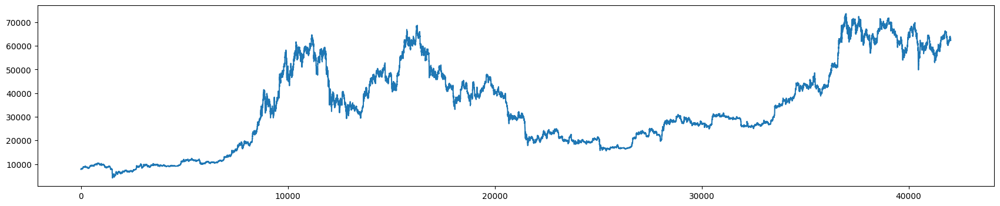

In [161]:
ohlcv["Close"].plot(figsize=(21, 4))
plt.show()

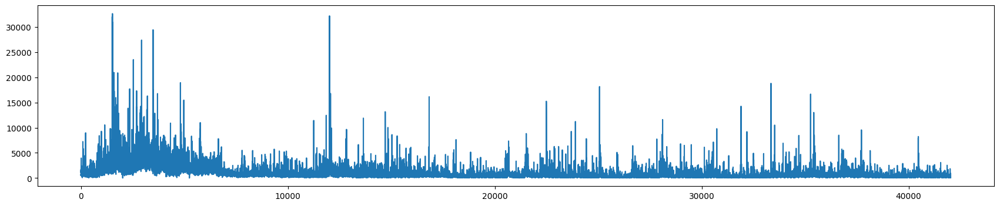

In [162]:
ohlcv["Volume"].plot(figsize=(21, 4))
plt.show()

# Сглаживание данных Close BTC-USDT

In [163]:
def plot_data(df, title):
    """
    Функция для построения графика данных.

    :param df: DataFrame с данными для построения.
    :param title: Заголовок графика.
    """
    df.plot(figsize=(21, 5))
    plt.title(title)
    plt.xlabel('Дата')
    plt.ylabel('Цена (USDT)')
    plt.legend()
    plt.grid(True)
    plt.show()

## SMA

In [164]:
def sma_smoothing(ohlcv, window_size=[20]):
    df = ohlcv["Close"].to_frame().copy()
    for param in window_size:
        df[f"SMA_{param}"] = df['Close'].rolling(window=param, min_periods=1).mean()

    plot_data(df, "BTC-USDT и простая скользящая средняя (SMA)")

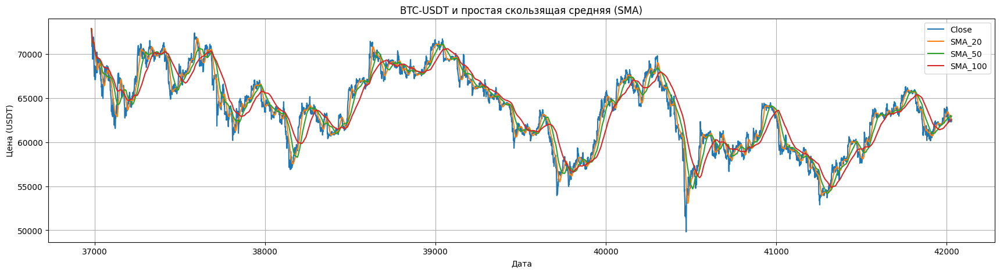

In [165]:
sma_smoothing(ohlcv.iloc[-5000:], [20, 50, 100])

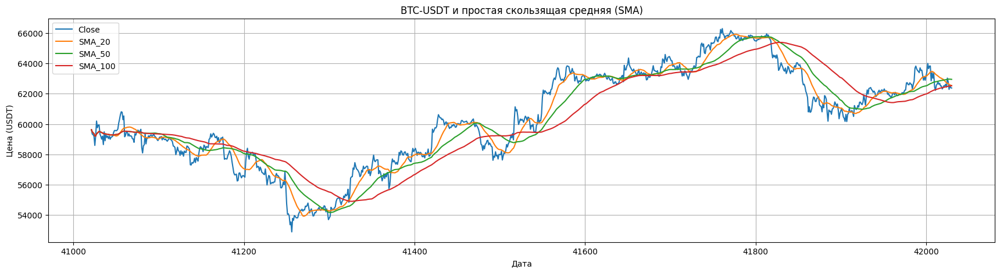

In [166]:
sma_smoothing(ohlcv.iloc[-1000:], [20, 50, 100])

## EMA

In [167]:
def ema_smoothing(ohlcv, span=[20]):
    df = ohlcv["Close"].to_frame().copy()
    for param in span:
        df[f"EMA_{param}"] = df['Close'].ewm(span=param, adjust=False).mean()

    plot_data(df, "BTC-USDT и экспоненциальная скользящая средняя (EMA)")

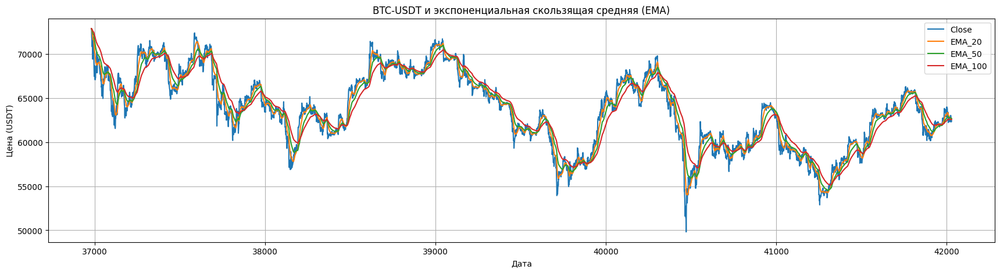

In [168]:
ema_smoothing(ohlcv.iloc[-5000:], [20, 50, 100])

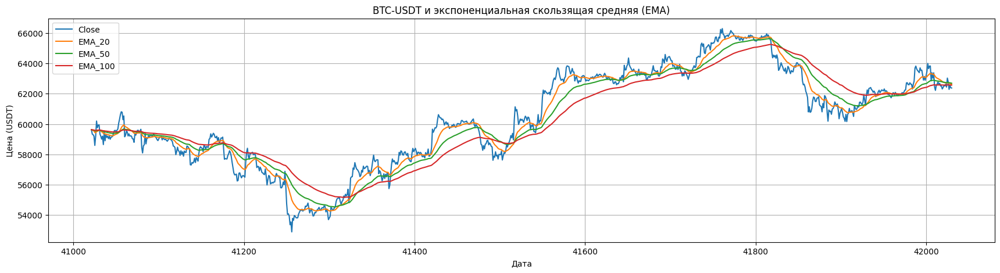

In [169]:
ema_smoothing(ohlcv.iloc[-1000:], [20, 50, 100])

## Gaussian Smoothing

In [170]:
def gaussian_smoothing(ohlcv, window_sizes=[20]):
    # Копируем данные закрытия
    df = ohlcv["Close"].to_frame().copy()
    
    for window_size in window_sizes:
        # Определяем sigma
        sigma = window_size / 6
        
        # Применяем гауссово сглаживание
        smoothed = df['Close'].rolling(window=window_size, win_type='gaussian').mean(std=sigma)
        
        # Добавляем сглаженные значения в DataFrame с уникальным именем колонки
        column_name = f'Gaussian_Smoothing_{window_size}'
        df[column_name] = smoothed
    
    # Визуализируем результаты
    plot_data(df, "BTC-USDT с Гауссовым Сглаживанием")

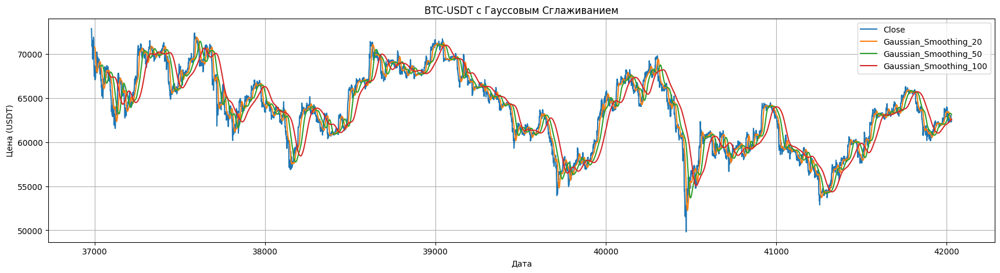

In [171]:
gaussian_smoothing(ohlcv.iloc[-5000:], [20, 50, 100])

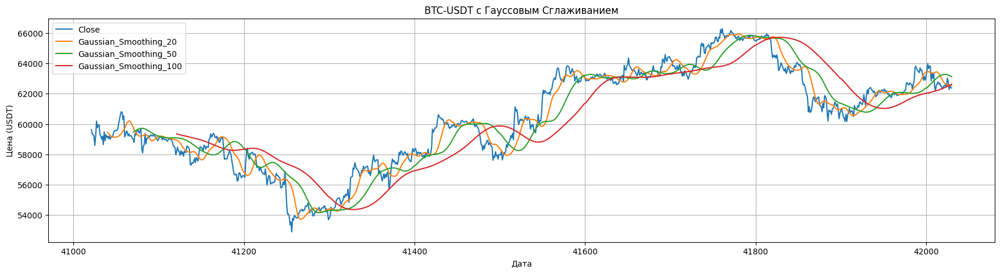

In [172]:
gaussian_smoothing(ohlcv.iloc[-1000:], [20, 50, 100])

## Exponential Smoothing

In [173]:
from statsmodels.tsa.api import SimpleExpSmoothing

In [174]:
def exponential_smoothing(ohlcv, alphas=[0.2]):
    df = pd.DataFrame()
    df['Close'] = ohlcv['Close']
    for alpha in alphas:
        ses_model = SimpleExpSmoothing(ohlcv['Close']).fit(smoothing_level=alpha, optimized=False)
        df[f'ES_alpha_{alpha}'] = ses_model.fittedvalues
    plot_data(df, "BTC-USDT и Экспоненциальное Сглаживание (ES)")

/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


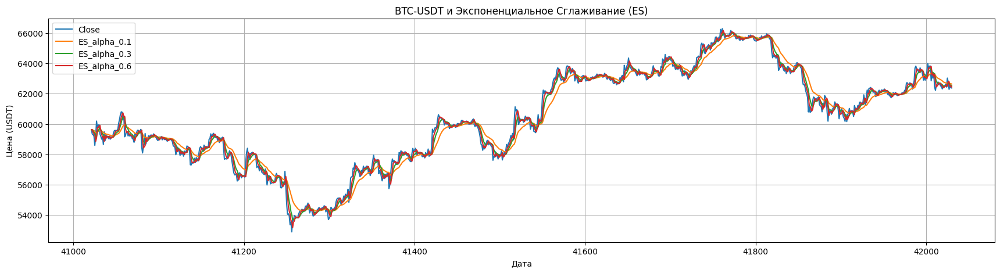

In [175]:
exponential_smoothing(ohlcv.iloc[-1000:], [0.1, 0.3, 0.6])

## Double Exponential

In [176]:
from statsmodels.tsa.api import ExponentialSmoothing

In [177]:
def double_exponential_smoothing(ohlcv, alphas=[0.2], betas=[0.1]):
    df = pd.DataFrame()
    df['Close'] = ohlcv['Close']
    for alpha in alphas:
        for beta in betas:
            holt_model = ExponentialSmoothing(ohlcv['Close'], trend='add').fit(smoothing_level=alpha, smoothing_trend=beta, optimized=False)
            df[f'Holt_alpha_{alpha}_beta_{beta}'] = holt_model.fittedvalues
    plot_data(df, "BTC-USDT и Двойное Экспоненциальное Сглаживание (Holt’s Linear Trend)")

/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


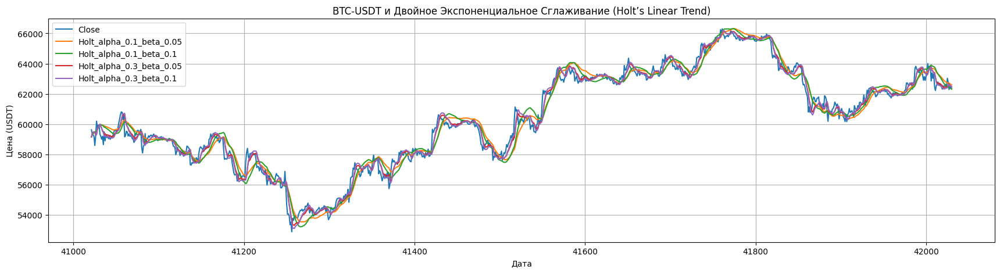

In [178]:
double_exponential_smoothing(ohlcv.iloc[-1000:], [0.1, 0.3], [0.05, 0.1])

## Holt-Winters

In [179]:
def holt_winters_smoothing(ohlcv, seasonal_periods=[12], trend='add', seasonal='add'):
    # Копируем данные закрытия
    df = ohlcv["Close"].to_frame().copy()

    for param in seasonal_periods:
        # Инициализируем модель Холта-Винтерса
        model = ExponentialSmoothing(
            df['Close'],
            trend=trend,
            seasonal=seasonal,
            seasonal_periods=param
        )
    
        # Обучаем модель
        fit = model.fit()
    
        # Добавляем сглаженные значения в DataFrame
        df[f'Holt_Winters_seasonal_periods_{param}'] = fit.fittedvalues

    # Визуализируем результаты
    plot_data(df, "BTC-USDT с сглаживанием Холта-Винтерса")

/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/site-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/site-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/site-packages/statsmodels/

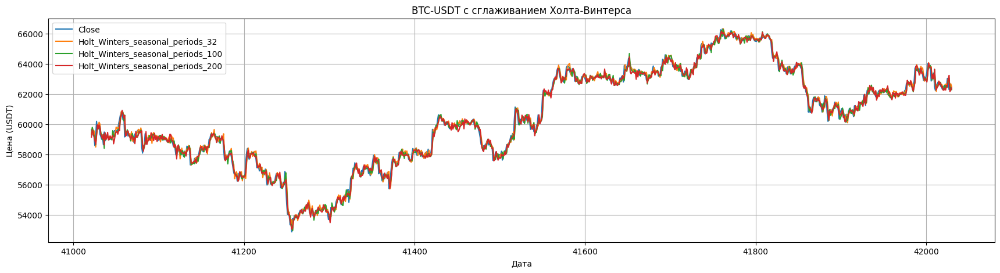

In [180]:
holt_winters_smoothing(ohlcv.iloc[-1000:], [32, 100, 200])

/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/site-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/site-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


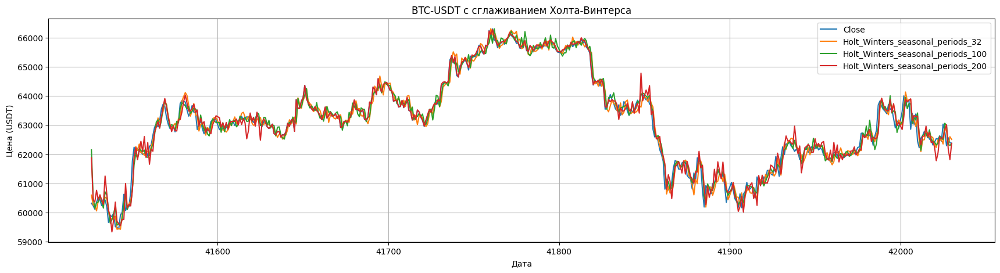

In [181]:
holt_winters_smoothing(ohlcv.iloc[-500:], [32, 100, 200])

## Kalman Filter

In [182]:
from filterpy.kalman import KalmanFilter

In [183]:
def kalman_filter_smoothing(ohlcv, Q_list=[1e-5], R_list=[1e-2]):
    data = ohlcv["Close"].to_numpy()
    df = ohlcv["Close"].to_frame().copy()

    for Q in Q_list:
        for R in R_list:
            # Инициализируем фильтр Калмана
            kf = KalmanFilter(dim_x=1, dim_z=1)
            kf.x = np.array([data[0]])       # Начальное состояние
            kf.P = np.array([[1.]])          # Начальная ковариация
            kf.F = np.array([[1.]])          # Матрица перехода состояния
            kf.H = np.array([[1.]])          # Матрица наблюдений
            kf.R = R                          # Ковариация наблюдений
            kf.Q = Q                          # Ковариация процесса
    
            # Массив для хранения сглаженных значений
            estimates = []
    
            for z in data:
                kf.predict()
                kf.update(z)
                estimates.append(kf.x[0])
    
            # Добавляем результаты в DataFrame
            df[f'Kalman_Filter_Q_{Q}_R_{R}'] = estimates

    plot_data(df, "BTC-USDT с фильтром Калмана (Kalman Filter)")

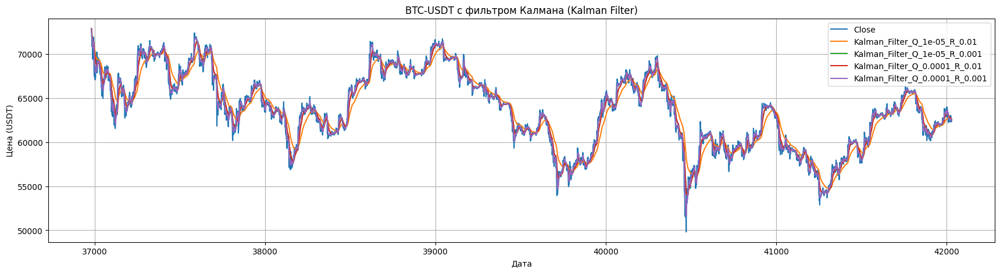

In [184]:
kalman_filter_smoothing(ohlcv.iloc[-5000:], [1e-5, 1e-4], [1e-2, 1e-3])

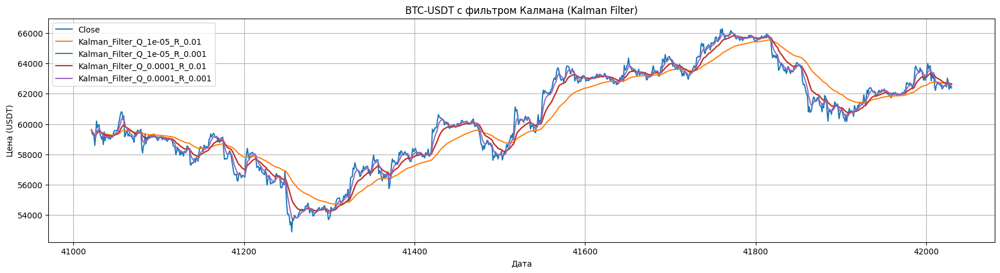

In [185]:
kalman_filter_smoothing(ohlcv.iloc[-1000:], [1e-5, 1e-4], [1e-2, 1e-3])

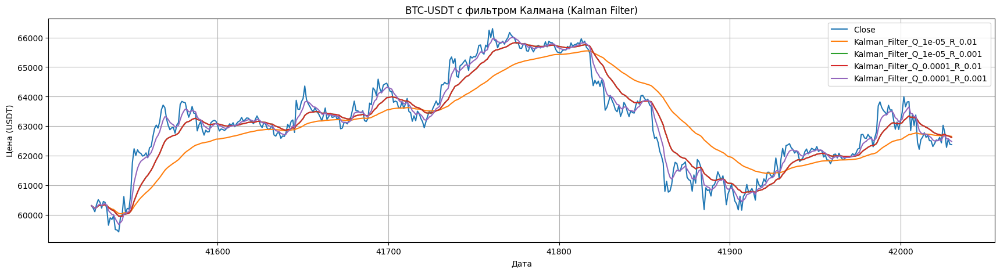

In [186]:
kalman_filter_smoothing(ohlcv.iloc[-500:], [1e-5, 1e-4], [1e-2, 1e-3])

## Savitzky-Golay Filter

In [187]:
from scipy.signal import savgol_filter

In [188]:
def savgol_filter_smoothing(ohlcv, window_lengths=[21, 41], poly_orders=[3, 4]):
    close_prices = ohlcv["Close"].to_numpy()
    df = ohlcv["Close"].to_frame().copy()
    
    # Применяем фильтр Савицкого–Голея для каждого набора параметров
    for window in window_lengths:
        for poly in poly_orders:
            # Фильтр Савицкого–Голея требует, чтобы размер окна был нечетным и больше полинома
            if window % 2 == 0:
                window += 1  # Увеличиваем до ближайшего нечетного числа
            if window <= poly:
                raise ValueError(f"Размер окна ({window}) должен быть больше порядка полинома ({poly}).")
            
            smoothed = savgol_filter(close_prices, window_length=window, polyorder=poly)
            
            df[f'SavGolay_win_{window}_poly_{poly}'] = smoothed
    
    # Визуализируем результаты
    plot_data(df, "BTC-USDT с фильтром Савицкого–Голея")

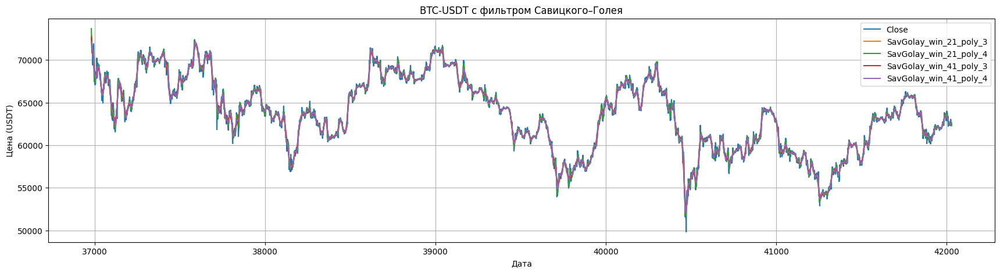

In [189]:
savgol_filter_smoothing(ohlcv.iloc[-5000:])

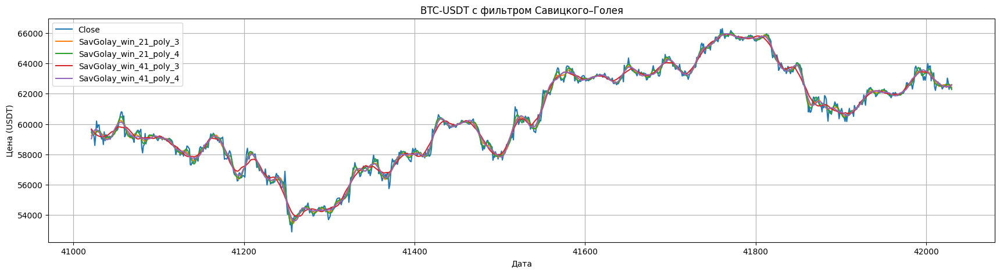

In [190]:
savgol_filter_smoothing(ohlcv.iloc[-1000:])

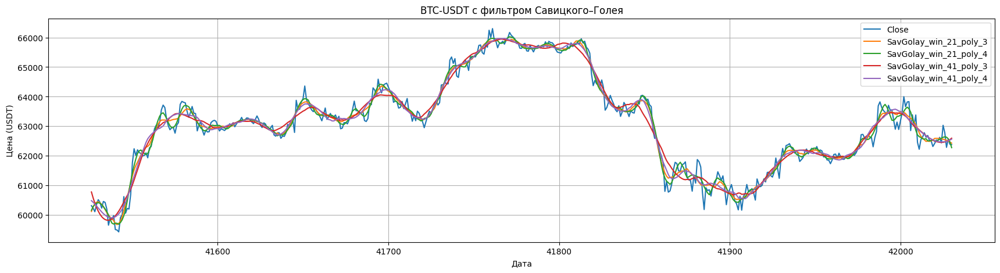

In [191]:
savgol_filter_smoothing(ohlcv.iloc[-500:])

## Hodrick-Prescott Filte

In [192]:
from statsmodels.tsa.filters.hp_filter import hpfilter

In [193]:
def hodrick_prescott_filter(ohlcv, lambdas=[20, 1600, 14400]):
    df = ohlcv["Close"].to_frame().copy()

    for lam in lambdas:
        cycle, trend = hpfilter(df['Close'], lamb=lam)
        df[f'Hodrick_Prescott_Trend_lambda_{lam}'] = trend
    
    plot_data(df, "BTC-USDT с фильтром Ходрика–Прескотта")

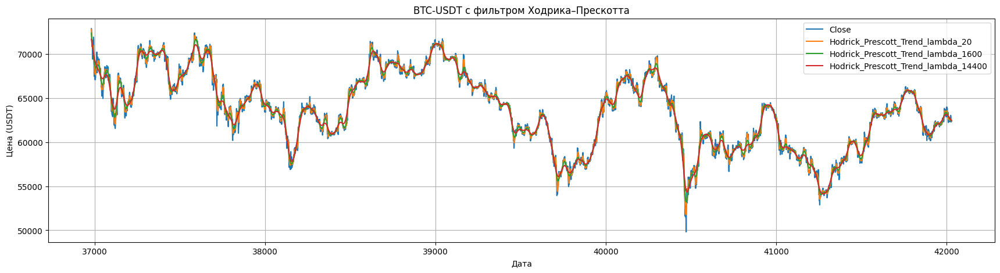

In [194]:
hodrick_prescott_filter(ohlcv.iloc[-5000:])

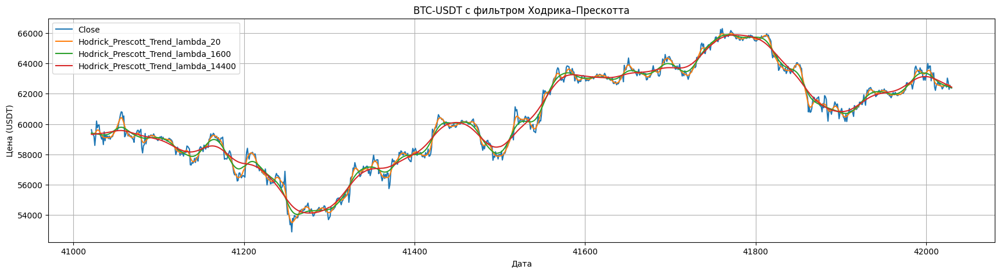

In [195]:
hodrick_prescott_filter(ohlcv.iloc[-1000:])

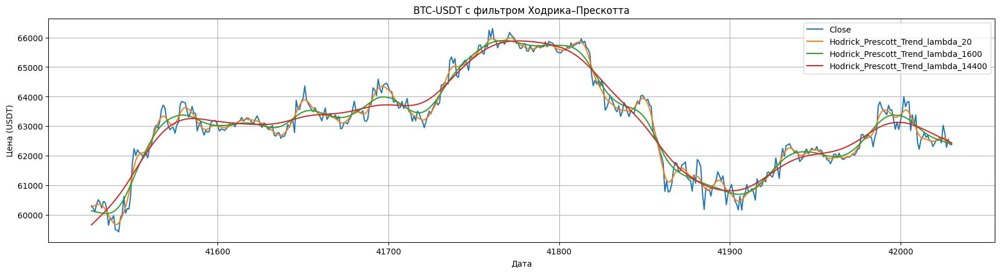

In [196]:
hodrick_prescott_filter(ohlcv.iloc[-500:])

## Fourier Filtering

In [197]:
def fourier_filtering(ohlcv, cutoff_frequencies=[0.01, 0.05, 0.1, 0.15]):    
    close_prices = ohlcv["Close"].to_numpy()
    n = len(close_prices)
    
    fft_values = np.fft.fft(close_prices)
    frequencies = np.fft.fftfreq(n)
    
    df = ohlcv["Close"].to_frame().copy()
    
    for cutoff in cutoff_frequencies:
        mask = np.abs(frequencies) <= cutoff
        
        fft_filtered = fft_values * mask
        
        smoothed = np.fft.ifft(fft_filtered).real
        
        df[f'Fourier_LowPass_cutoff_{cutoff}'] = smoothed
    
    plot_data(df, "BTC-USDT с Fourier Низкочастотным Фильтром")

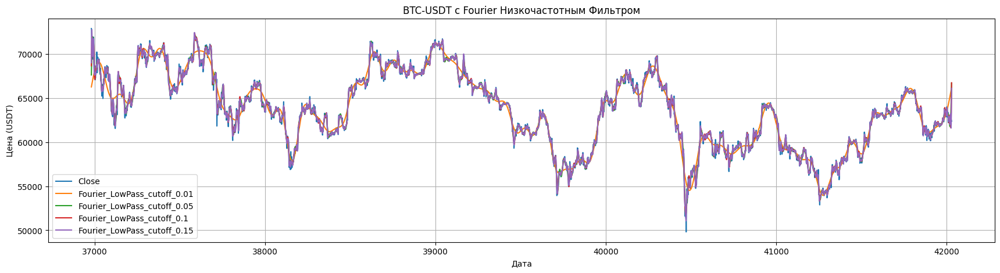

In [198]:
fourier_filtering(ohlcv.iloc[-5000:])

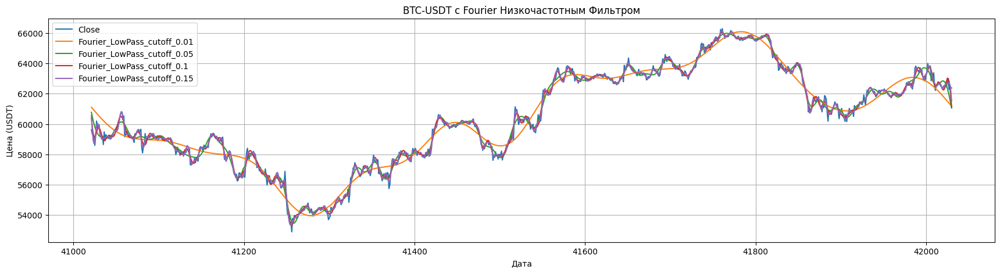

In [199]:
fourier_filtering(ohlcv.iloc[-1000:])

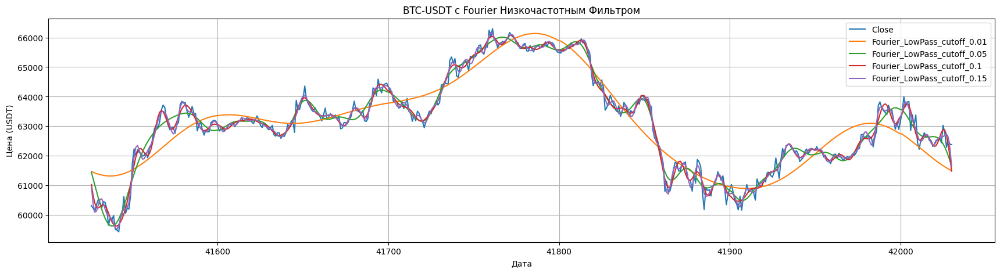

In [200]:
fourier_filtering(ohlcv.iloc[-500:])

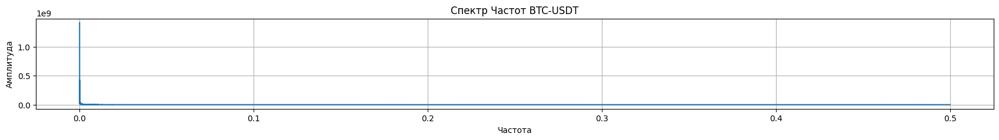

In [201]:
def plot_frequency_spectrum(ohlcv):
    close_prices = ohlcv["Close"].to_numpy()
    n = len(close_prices)
    fft_values = np.fft.fft(close_prices)
    frequencies = np.fft.fftfreq(n)
    magnitude = np.abs(fft_values)
    
    plt.figure(figsize=(21, 2))
    plt.plot(frequencies[:n//2], magnitude[:n//2])
    plt.title('Спектр Частот BTC-USDT')
    plt.xlabel('Частота')
    plt.ylabel('Амплитуда')
    plt.grid(True)
    plt.show()

# Пример использования
plot_frequency_spectrum(ohlcv)

## Wavelet Filtering

In [202]:
import pywt

In [203]:
def wavelet_filtering(ohlcv, wavelet_names=['db4', 'sym4'], levels=[2, 3]):
    close_prices = ohlcv["Close"].values
    df = ohlcv["Close"].to_frame().copy()

    for wavelet in wavelet_names:
        for level in levels:
            max_level = pywt.dwt_max_level(data_len=len(close_prices), filter_len=pywt.Wavelet(wavelet).dec_len)
            if level > max_level:
                raise ValueError(f"Уровень декомпозиции {level} превышает максимальный {max_level} для вейвлета '{wavelet}'.")
    
            coeffs = pywt.wavedec(data=close_prices, wavelet=wavelet, level=level)
    
            coeffs_filtered = [coeffs[0]] + [np.zeros_like(detail) for detail in coeffs[1:]]
    
            reconstructed_signal = pywt.waverec(coeffs_filtered, wavelet)
    
            reconstructed_signal = reconstructed_signal[:len(close_prices)]
    
            column_name = f'Wavelet_{wavelet}_Level_{level}'
            df[column_name] = reconstructed_signal

    plot_data(df, "BTC-USDT с Вейвлет-Фильтрацией")

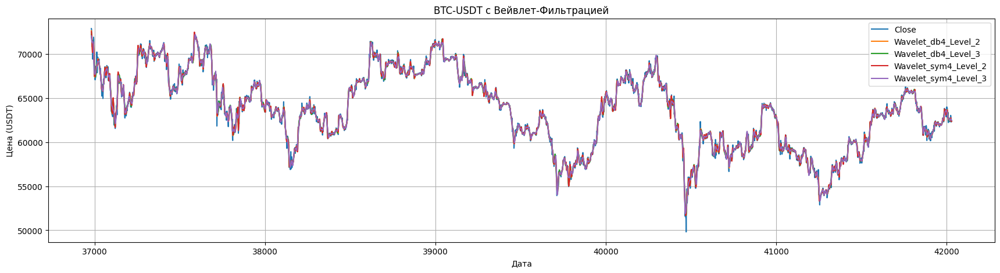

In [204]:
wavelet_filtering(ohlcv.iloc[-5000:])

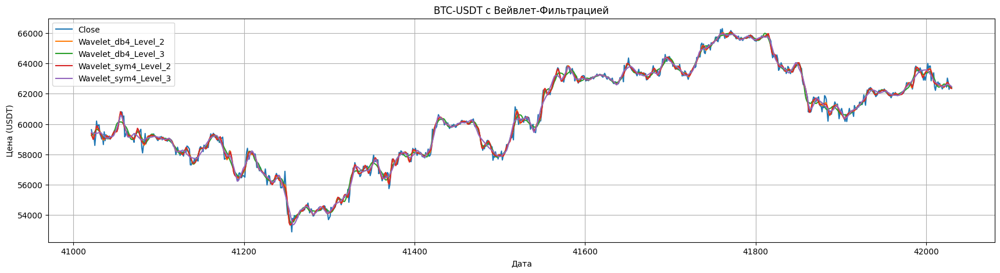

In [205]:
wavelet_filtering(ohlcv.iloc[-1000:])

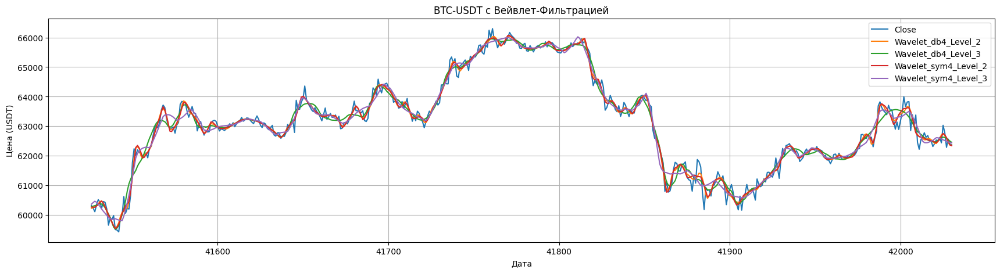

In [206]:
wavelet_filtering(ohlcv.iloc[-500:])

## Spline Smoothing

In [207]:
from scipy.interpolate import UnivariateSpline

In [208]:
def spline_smoothing(ohlcv, smoothing_factors=[1e7, 1e8, 1e9]):
    df = ohlcv["Close"].to_frame().copy()
    
    x = range(len(df))
    y = df['Close'].values
    
    for s in smoothing_factors:
        spline = UnivariateSpline(x, y, s=s)
        
        smoothed = spline(x)
        
        column_name = f'Spline_Smoothing_s{s}'
        df[column_name] = smoothed
    
    plot_data(df, "BTC-USDT со Сплайн-Сглаживанием")

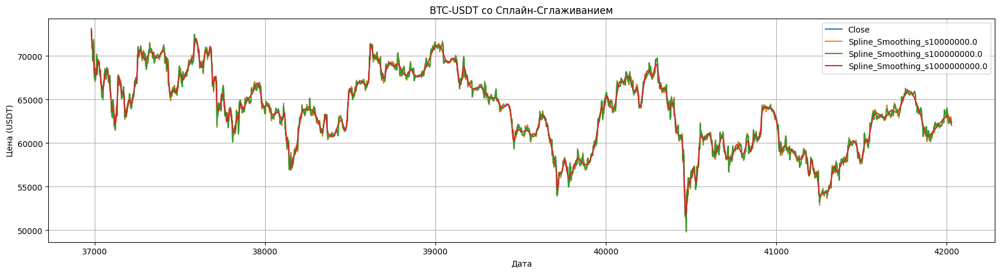

In [209]:
spline_smoothing(ohlcv.iloc[-5000:])

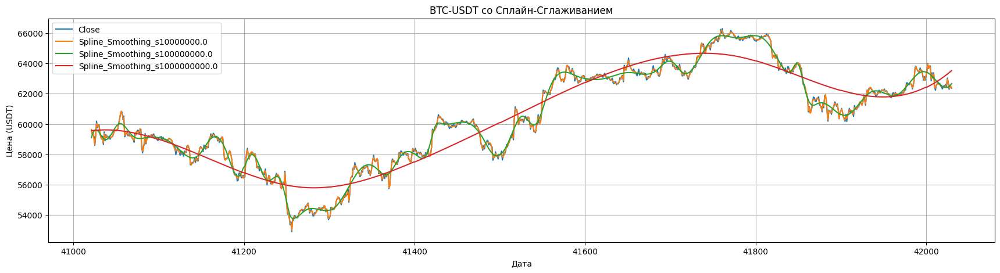

In [210]:
spline_smoothing(ohlcv.iloc[-1000:])

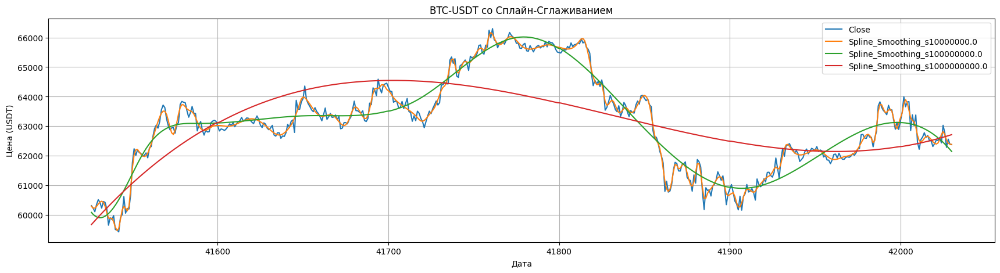

In [211]:
spline_smoothing(ohlcv.iloc[-500:])

## Вывод (TODO)

Будет использовать 

* Kalman Filter Q=1e-4, R=1e-3
* Spline Filtering smoothing_factor=1e7
* Savitzky-Golay Filter win=21 poly=4

Fourier Filtering cutoff_frequencies=0.15 не подходит, т.к. сглаженные данные будут разными

Hodrick-Prescott Filte lambda = 20 не подхлдит, ему нужны все данные.

# Расчёт индикаторов

In [212]:
import talib

## RSI

In [213]:
def plot_rsi(ohlcv, time_period=14, overbought=70, oversold=30):
    """
    Рассчитывает и визуализирует RSI.
    
    :param ohlcv: DataFrame с колонками ['Open', 'High', 'Low', 'Close', 'Volume']
    :param time_period: Период для расчёта RSI
    :param overbought: Уровень перекупленности
    :param oversold: Уровень перепроданности
    """
    close = ohlcv['Close']
    rsi = talib.RSI(close, timeperiod=time_period)

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(21, 6), sharex=True)
    
    ax1.plot(ohlcv.index, close, label='Close Price')
    ax1.set_title('Цена закрытия')
    ax1.legend()
    
    ax2.plot(ohlcv.index, rsi, label='RSI', color='orange')
    ax2.set_title('RSI')
    ax2.legend()
    
    plt.show()

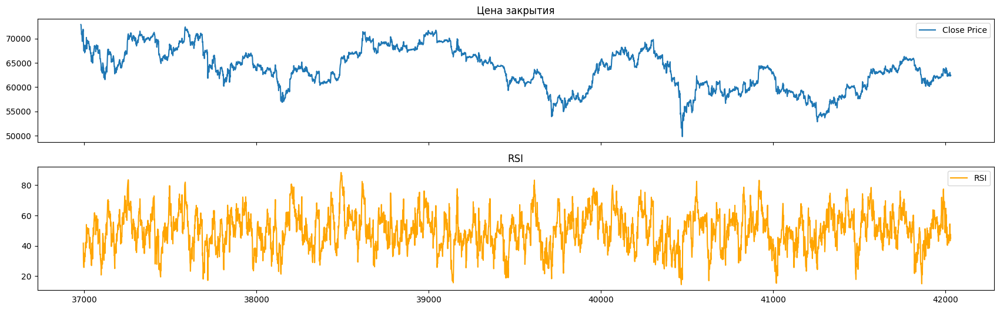

In [214]:
plot_rsi(ohlcv.iloc[-5000:])

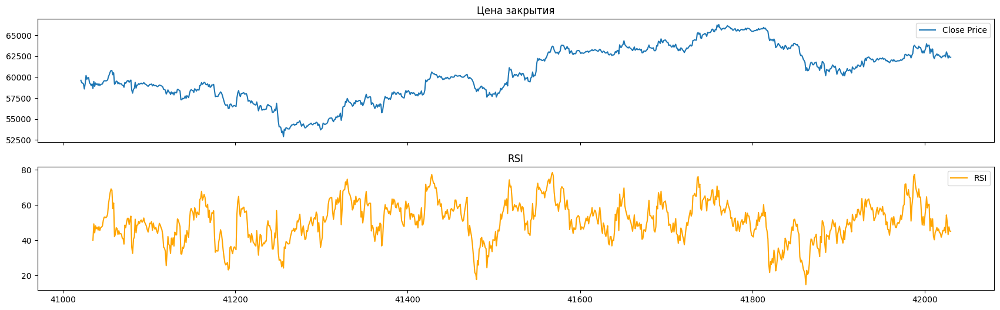

In [215]:
plot_rsi(ohlcv.iloc[-1000:])

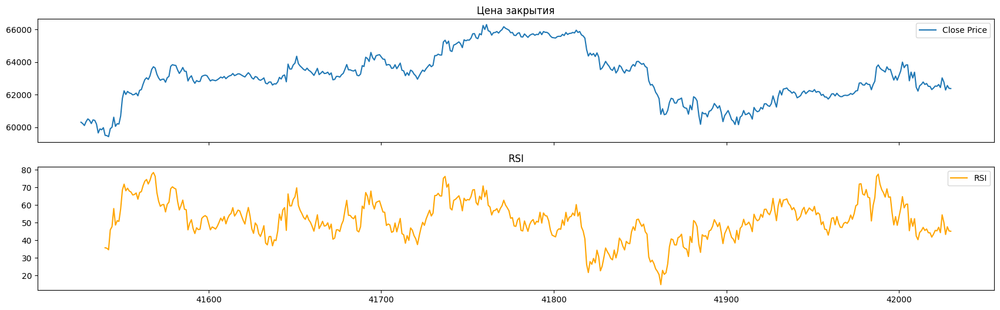

In [216]:
plot_rsi(ohlcv.iloc[-500:])

## BBANDS

In [217]:
def plot_bbands(ohlcv, time_period=20, nbdevup=2, nbdevdn=2, matype=0):
    close = ohlcv['Close']
    upper, middle, lower = talib.BBANDS(close, timeperiod=time_period, nbdevup=nbdevup, nbdevdn=nbdevdn, matype=matype)
    
    plt.figure(figsize=(21, 5))
    plt.plot(ohlcv.index, close, label='Close Price')
    plt.plot(ohlcv.index, upper, label='Upper Band', color='orange')
    plt.plot(ohlcv.index, middle, label='Middle Band', color='purple')
    plt.plot(ohlcv.index, lower, label='Lower Band', color='orange')
    plt.title('Цена закрытия и Bollinger Bands')
    plt.legend()
    plt.show()

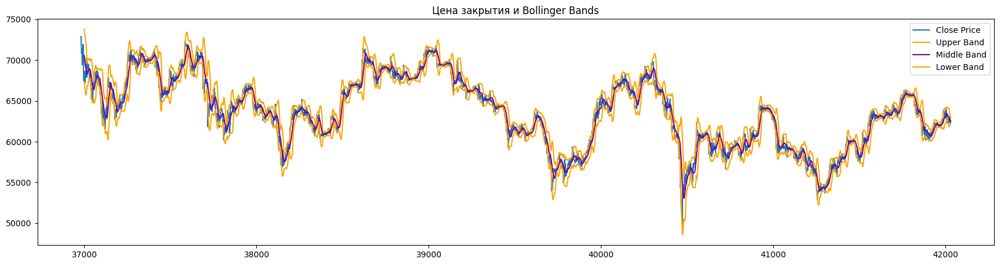

In [218]:
plot_bbands(ohlcv.iloc[-5000:])

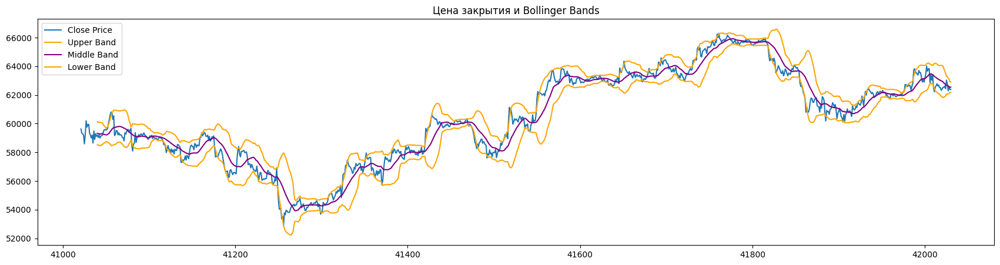

In [219]:
plot_bbands(ohlcv.iloc[-1000:])

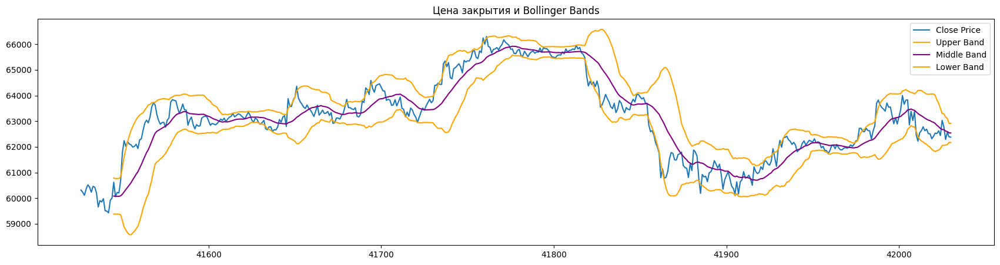

In [220]:
plot_bbands(ohlcv.iloc[-500:])

## MACD

In [221]:
def plot_macd(ohlcv, fastperiod=12, slowperiod=26, signalperiod=9):
    close = ohlcv['Close']
    macd, macdsignal, macdhist = talib.MACD(close, fastperiod=fastperiod, slowperiod=slowperiod, signalperiod=signalperiod)
    
    # Разделённый график: Цена и MACD
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(21, 7), sharex=True)
    
    ax1.plot(ohlcv.index, close, label='Close Price')
    ax1.set_title('Цена закрытия')
    ax1.legend()
    
    ax2.plot(ohlcv.index, macd, label='MACD', color='blue')
    ax2.plot(ohlcv.index, macdsignal, label='Signal Line', color='red')
    ax2.bar(ohlcv.index, macdhist, label='MACD Histogram', color='grey')
    ax2.set_title('MACD')
    ax2.legend()
    
    plt.show()

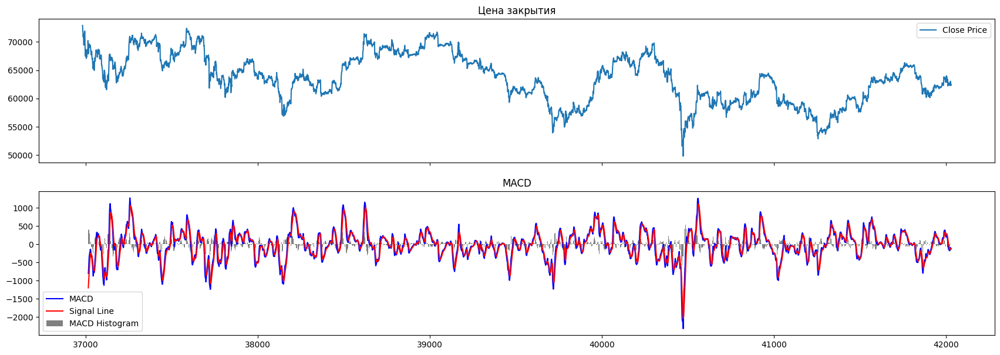

In [222]:
plot_macd(ohlcv.iloc[-5000:])

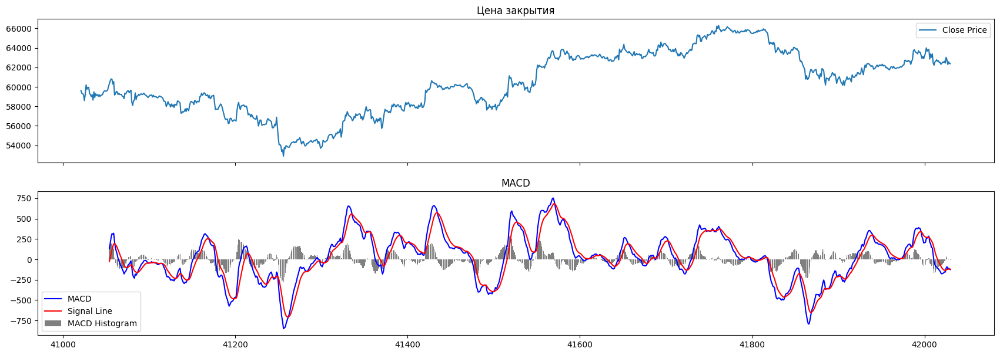

In [223]:
plot_macd(ohlcv.iloc[-1000:])

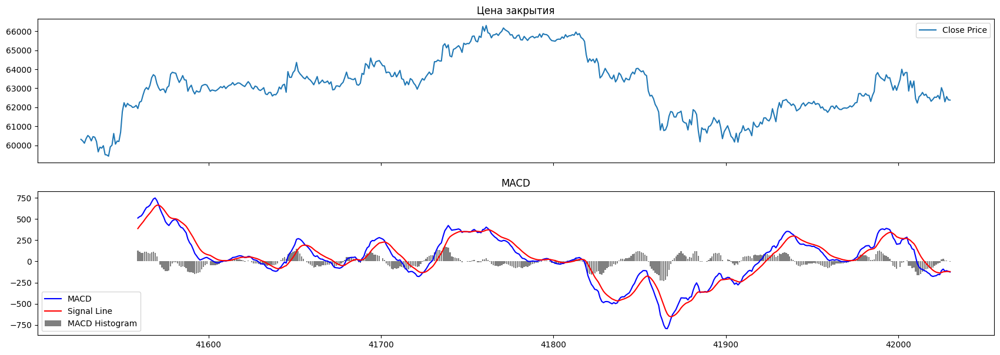

In [224]:
plot_macd(ohlcv.iloc[-500:])

## PPO

In [225]:
def plot_ppo(ohlcv, fastperiod=12, slowperiod=26, matype=0):
    close = ohlcv['Close']
    ppo = talib.PPO(close, fastperiod=fastperiod, slowperiod=slowperiod, matype=matype)
    
    # Разделённые графики
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(21, 7), sharex=True)
    
    ax1.plot(ohlcv.index, close, label='Close Price')
    ax1.set_title('Цена закрытия')
    ax1.legend()
    
    ax2.plot(ohlcv.index, ppo, label='PPO', color='purple')
    ax2.set_title('PPO')
    ax2.legend()
    
    plt.show()

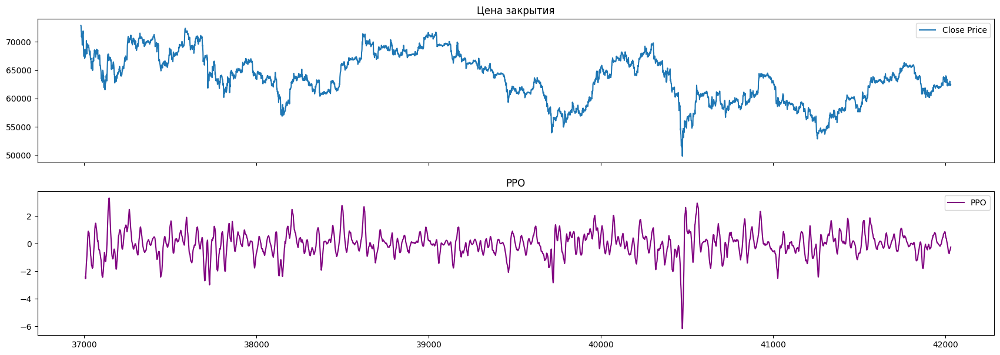

In [226]:
plot_ppo(ohlcv.iloc[-5000:])

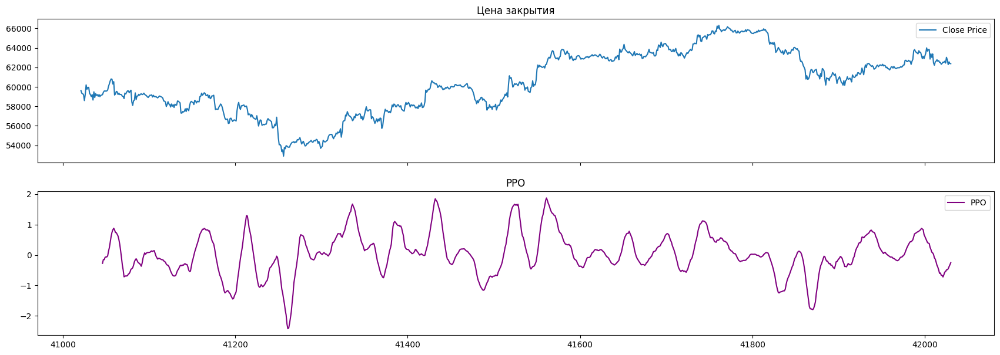

In [227]:
plot_ppo(ohlcv.iloc[-1000:])

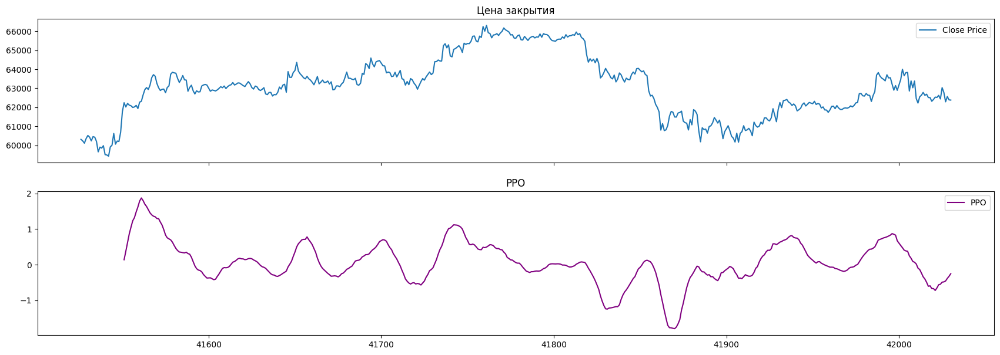

In [228]:
plot_ppo(ohlcv.iloc[-500:])

## ADX

In [229]:
def plot_adx(ohlcv, time_period=14):
    high = ohlcv['High']
    low = ohlcv['Low']
    close = ohlcv['Close']
    
    adx = talib.ADX(high, low, close, timeperiod=time_period)
    plus_di = talib.PLUS_DI(high, low, close, timeperiod=time_period)
    minus_di = talib.MINUS_DI(high, low, close, timeperiod=time_period)    

    # Разделённые графики
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(21, 6), sharex=True)
    
    ax1.plot(ohlcv.index, close, label='Close Price')
    ax1.set_title('Цена закрытия')
    ax1.legend()
    
    ax2.plot(ohlcv.index, adx, label='ADX', color='magenta')
    ax2.plot(ohlcv.index, plus_di, label='+DI', color='green')
    ax2.plot(ohlcv.index, minus_di, label='-DI', color='red')
    ax2.axhline(25, color='grey', linestyle='--')
    ax2.set_title('ADX')
    ax2.legend()

    
    plt.show()

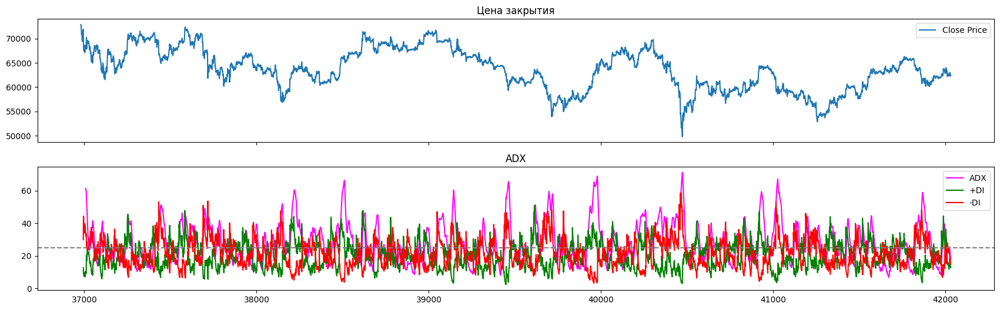

In [230]:
plot_adx(ohlcv.iloc[-5000:])

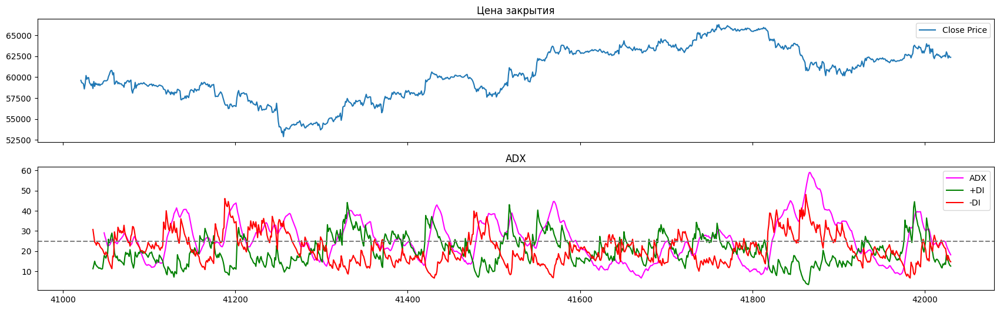

In [231]:
plot_adx(ohlcv.iloc[-1000:])

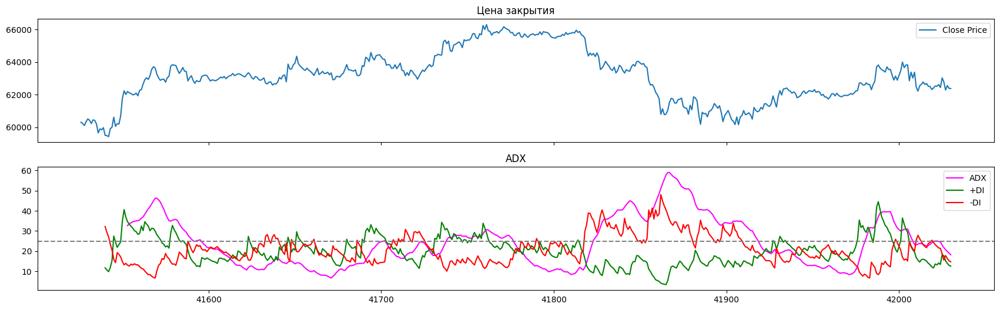

In [232]:
plot_adx(ohlcv.iloc[-500:])

# Расчёт сигналов

## RSI

In [233]:
def plot_rsi_with_signals(ohlcv, time_period=14, overbought=70, oversold=30):
    close = ohlcv['Close']
    rsi = talib.RSI(close, timeperiod=time_period)

    # Определение сигналов
    buy_signals = (rsi.shift(1) < oversold) & (rsi > oversold)
    sell_signals = (rsi.shift(1) > overbought) & (rsi < overbought)

    plt.figure(figsize=(21, 8))

    # Основной график цены
    ax1 = plt.subplot(2, 1, 1)
    ax1.plot(ohlcv.index, close, label='Цена закрытия', color='blue')
    ax1.set_title('RSI с сигналами покупки и продажи')
    ax1.legend()

    # Отмечаем сигналы на графике цены
    ax1.scatter(ohlcv.index[buy_signals], close[buy_signals], marker='^', color='green', label='Buy Signal', s=100)
    ax1.scatter(ohlcv.index[sell_signals], close[sell_signals], marker='v', color='red', label='Sell Signal', s=100)
    ax1.legend()

    # График RSI
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    ax2.plot(ohlcv.index, rsi, label='RSI', color='orange')
    ax2.axhline(overbought, color='red', linestyle='--')
    ax2.axhline(oversold, color='green', linestyle='--')

    # Отмечаем сигналы на графике RSI
    ax2.scatter(ohlcv.index[buy_signals], rsi[buy_signals], marker='^', color='green', label='Buy Signal', s=100)
    ax2.scatter(ohlcv.index[sell_signals], rsi[sell_signals], marker='v', color='red', label='Sell Signal', s=100)

    ax2.legend()

    plt.tight_layout()
    plt.show()

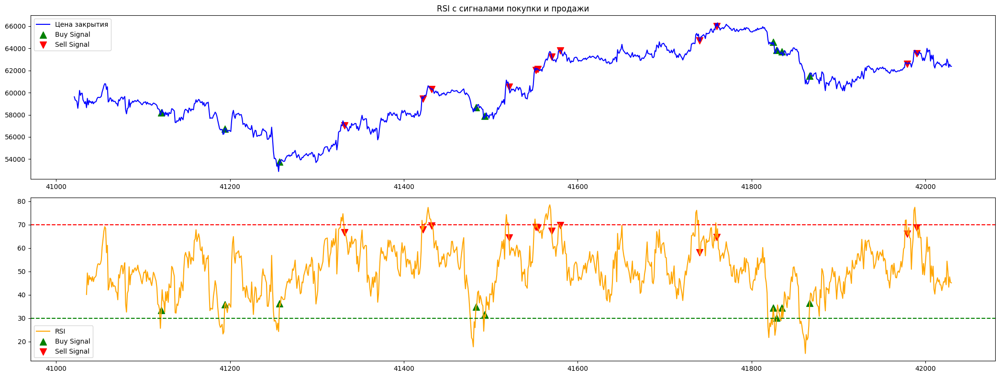

In [234]:
plot_rsi_with_signals(ohlcv.iloc[-1000:])

## BBANDS

In [235]:
def plot_bbands_with_signals(ohlcv, time_period=20, nbdevup=2, nbdevdn=2, matype=0):
    close = ohlcv['Close']
    upper, middle, lower = talib.BBANDS(close, timeperiod=time_period, nbdevup=nbdevup, nbdevdn=nbdevdn, matype=matype)

    # Определение сигналов
    buy_signals = (close.shift(1) > lower.shift(1)) & (close < lower)
    sell_signals = (close.shift(1) < upper.shift(1)) & (close > upper)

    plt.figure(figsize=(14, 8))

    # Основной график цены и Bollinger Bands
    ax1 = plt.subplot(2, 1, 1)
    ax1.plot(ohlcv.index, close, label='Цена закрытия', color='blue')
    ax1.plot(ohlcv.index, upper, label='Upper Band', color='red', linestyle='--')
    ax1.plot(ohlcv.index, middle, label='Middle Band', color='black', linestyle='--')
    ax1.plot(ohlcv.index, lower, label='Lower Band', color='green', linestyle='--')
    ax1.set_title('Bollinger Bands с сигналами покупки и продажи')
    ax1.legend()

    # Отмечаем сигналы на графике цены
    ax1.scatter(ohlcv.index[buy_signals], close[buy_signals], marker='^', color='green', label='Buy Signal', s=100)
    ax1.scatter(ohlcv.index[sell_signals], close[sell_signals], marker='v', color='red', label='Sell Signal', s=100)
    ax1.legend()

    # График расстояния цены до среднего
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    ax2.plot(ohlcv.index, close - middle, label='Distance to Middle', color='purple')
    ax2.axhline(0, color='black', linestyle='--')
    ax2.legend()

    plt.tight_layout()
    plt.show()

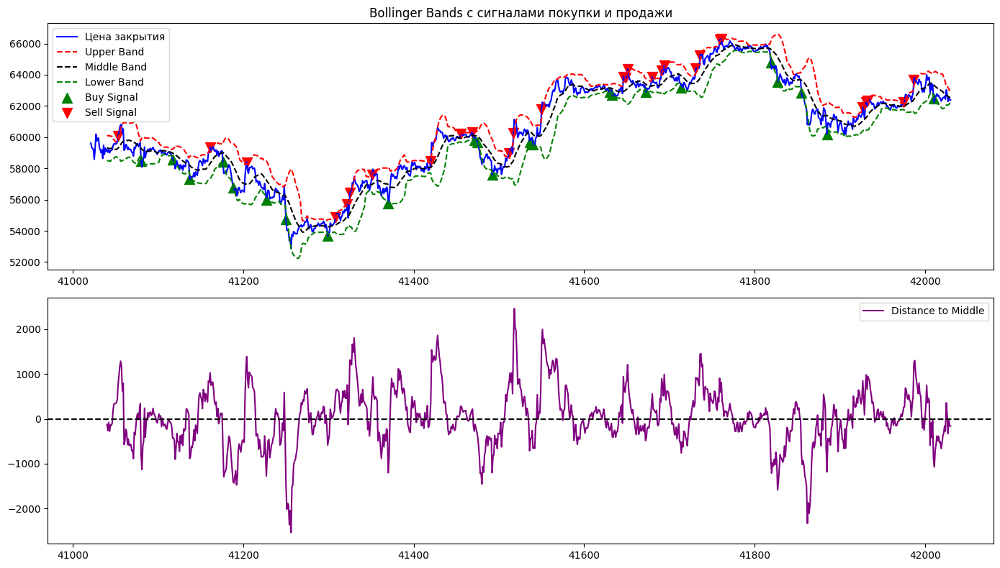

In [236]:
plot_bbands_with_signals(ohlcv.iloc[-1000:])

## MACD

In [237]:
def plot_macd_with_signals(ohlcv, fastperiod=12, slowperiod=26, signalperiod=9):
    close = ohlcv['Close']
    macd, macdsignal, macdhist = talib.MACD(close, fastperiod=fastperiod, slowperiod=slowperiod, signalperiod=signalperiod)

    # Определение сигналов
    buy_signals = (macd.shift(1) < macdsignal.shift(1)) & (macd > macdsignal)
    sell_signals = (macd.shift(1) > macdsignal.shift(1)) & (macd < macdsignal)

    plt.figure(figsize=(14, 10))

    # График цены с сигналами
    ax1 = plt.subplot(2, 1, 1)
    ax1.plot(ohlcv.index, close, label='Цена закрытия', color='blue')
    ax1.set_title('MACD с сигналами покупки и продажи')
    ax1.legend()

    ax1.scatter(ohlcv.index[buy_signals], close[buy_signals], marker='^', color='green', label='Buy Signal', s=100)
    ax1.scatter(ohlcv.index[sell_signals], close[sell_signals], marker='v', color='red', label='Sell Signal', s=100)
    ax1.legend()

    # График MACD
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    ax2.plot(ohlcv.index, macd, label='MACD', color='blue')
    ax2.plot(ohlcv.index, macdsignal, label='Signal Line', color='red')
    ax2.bar(ohlcv.index, macdhist, label='MACD Histogram', color='grey')
    ax2.set_title('MACD')
    ax2.legend()

    plt.tight_layout()
    plt.show()

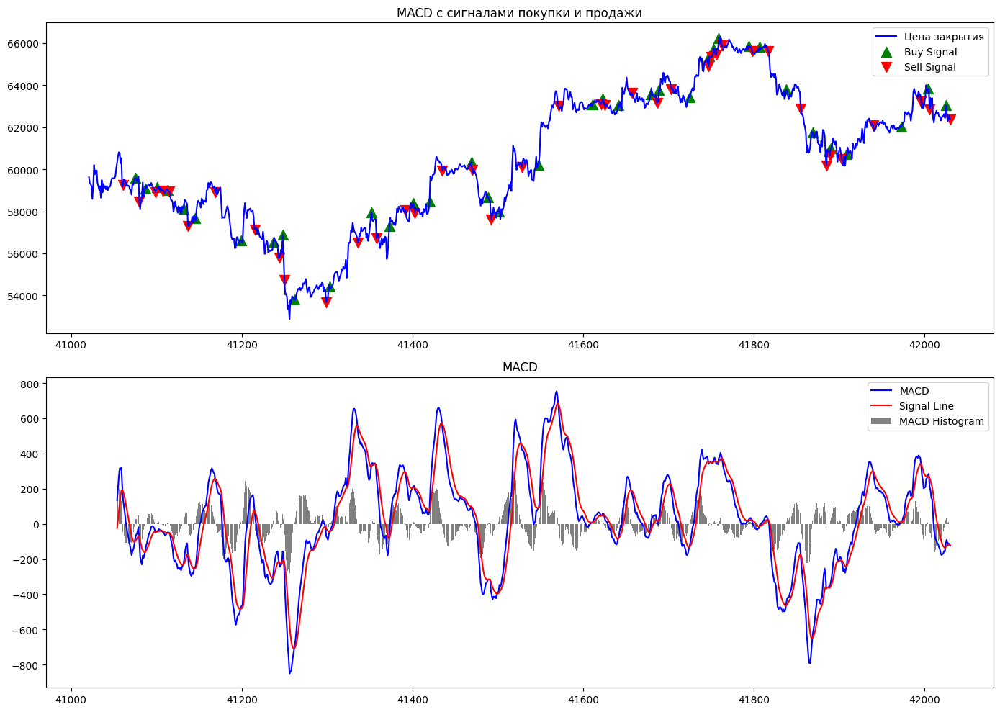

In [238]:
plot_macd_with_signals(ohlcv.iloc[-1000:])

## PPO

In [239]:
def plot_ppo_with_signals(ohlcv, fastperiod=12, slowperiod=26, signal_period=9, matype=0):
    close = ohlcv['Close']
    
    # Рассчитываем PPO
    ppo = talib.PPO(close, fastperiod=fastperiod, slowperiod=slowperiod, matype=matype)
    
    # Рассчитываем сигнальную линию PPO как EMA от PPO
    ppo_signal = talib.EMA(ppo, timeperiod=signal_period)
    
    # Определяем сигналы покупки и продажи
    # Сигнал на покупку: PPO пересекает сигнальную линию снизу вверх
    buy_signals = (ppo.shift(1) < ppo_signal.shift(1)) & (ppo > ppo_signal)
    
    # Сигнал на продажу: PPO пересекает сигнальную линию сверху вниз
    sell_signals = (ppo.shift(1) > ppo_signal.shift(1)) & (ppo < ppo_signal)
    
    plt.figure(figsize=(14, 8))
    
    # Основной график цены с сигналами
    ax1 = plt.subplot(2, 1, 1)
    ax1.plot(ohlcv.index, close, label='Цена закрытия', color='blue')
    ax1.set_title('PPO с сигналами покупки и продажи')
    ax1.legend()
    
    # Отмечаем сигналы на графике цены
    ax1.scatter(ohlcv.index[buy_signals], close[buy_signals], marker='^', color='green', label='Buy Signal', s=100)
    ax1.scatter(ohlcv.index[sell_signals], close[sell_signals], marker='v', color='red', label='Sell Signal', s=100)
    ax1.legend()
    
    # График PPO и сигнальной линии
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    ax2.plot(ohlcv.index, ppo, label='PPO', color='purple')
    ax2.plot(ohlcv.index, ppo_signal, label='Signal Line', color='orange')
    ax2.bar(ohlcv.index, ppo - ppo_signal, label='PPO Histogram', color='grey')
    ax2.set_title('PPO')
    ax2.legend()
    
    plt.tight_layout()
    plt.show()

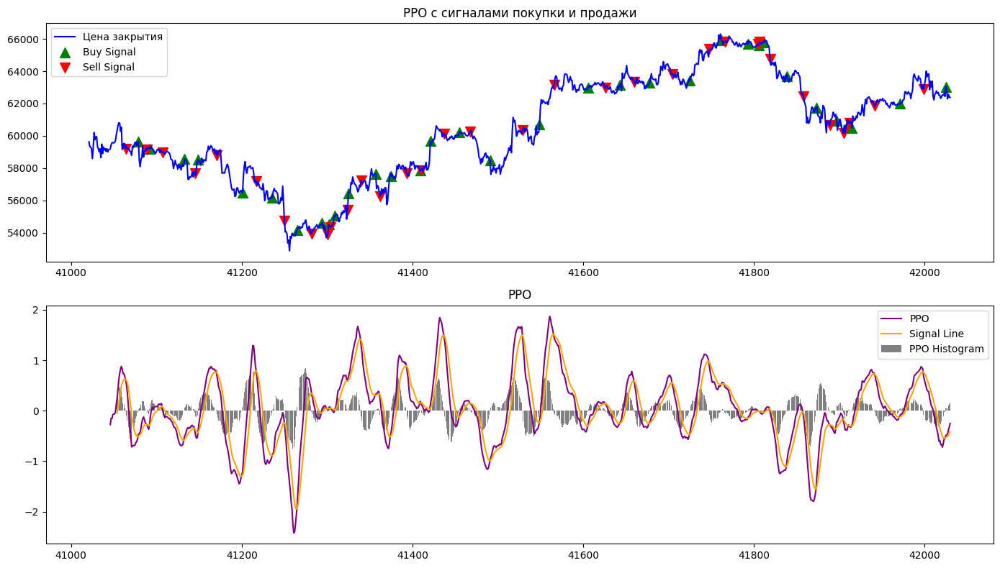

In [240]:
plot_ppo_with_signals(ohlcv.iloc[-1000:])

## ADX

In [241]:
def plot_adx_with_signals(ohlcv, time_period=14, adx_threshold=25):
    high = ohlcv['High']
    low = ohlcv['Low']
    close = ohlcv['Close']

    adx = talib.ADX(high, low, close, timeperiod=time_period)
    plus_di = talib.PLUS_DI(high, low, close, timeperiod=time_period)
    minus_di = talib.MINUS_DI(high, low, close, timeperiod=time_period)

    # Определение сигналов
    buy_signals = (plus_di.shift(1) < minus_di.shift(1)) & (plus_di > minus_di) & (adx > adx_threshold)
    sell_signals = (minus_di.shift(1) < plus_di.shift(1)) & (minus_di > plus_di) & (adx > adx_threshold)

    plt.figure(figsize=(14, 10))

    # График цены с сигналами
    ax1 = plt.subplot(3, 1, 1)
    ax1.plot(ohlcv.index, close, label='Цена закрытия', color='blue')
    ax1.set_title('ADX с сигналами покупки и продажи')
    ax1.legend()

    ax1.scatter(ohlcv.index[buy_signals], close[buy_signals], marker='^', color='green', label='Buy Signal', s=100)
    ax1.scatter(ohlcv.index[sell_signals], close[sell_signals], marker='v', color='red', label='Sell Signal', s=100)
    ax1.legend()

    # График ADX и DI линий
    ax2 = plt.subplot(3, 1, 2, sharex=ax1)
    ax2.plot(ohlcv.index, adx, label='ADX', color='magenta')
    ax2.axhline(adx_threshold, color='grey', linestyle='--')
    ax2.set_title('ADX')
    ax2.legend()

    # График +DI и -DI
    ax3 = plt.subplot(3, 1, 3, sharex=ax1)
    ax3.plot(ohlcv.index, plus_di, label='+DI', color='green')
    ax3.plot(ohlcv.index, minus_di, label='-DI', color='red')
    ax3.set_title('+DI и -DI')
    ax3.legend()

    plt.tight_layout()
    plt.show()

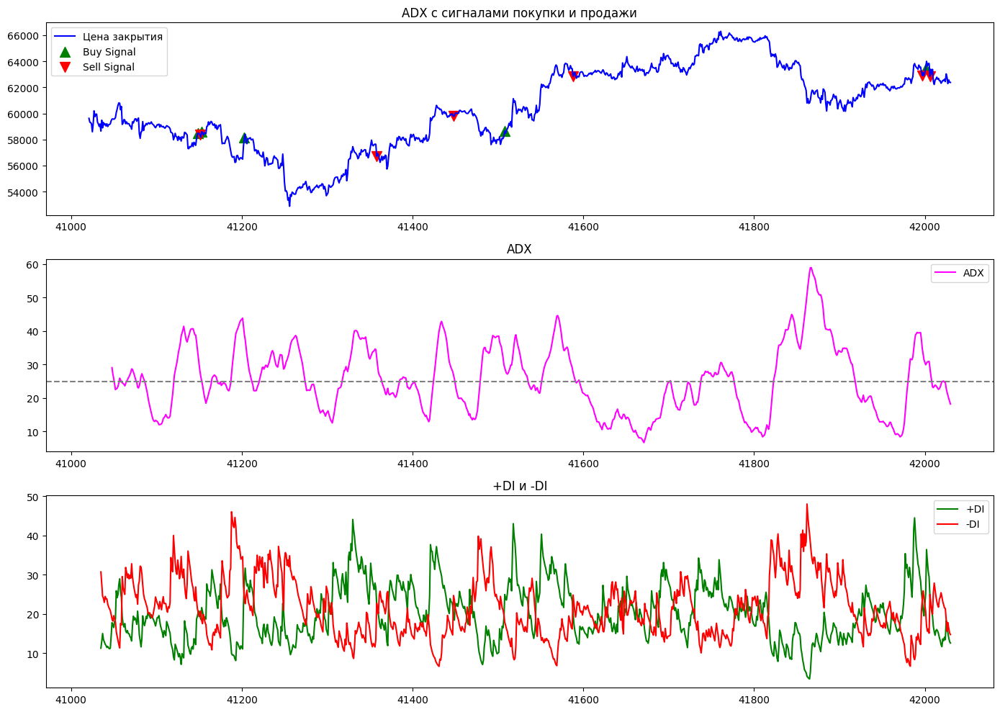

In [242]:
plot_adx_with_signals(ohlcv.iloc[-1000:])

# Создание датасетов для записи данных

Здесь будут созданы датасет, который изначально будет записан в БД, а другой датасет будет имитировать работу инкрементной записи AirFlow

In [243]:
df = ohlcv.copy()

In [244]:
df_save, df_test = df.iloc[:-1000], df.iloc[-1000:]

In [245]:
df_save.shape, df_test.shape

((40611, 6), (1000, 6))

## Расчётные функции фильров и сглаживателей

In [246]:
def apply_kalman_filtering(df, q=1e-4, r=1e-3):
    data = df.to_numpy()
    df = df.to_frame().copy()

    kf = KalmanFilter(dim_x=1, dim_z=1)
    kf.x = np.array([data[0]])      
    kf.P = np.array([[1.]])          
    kf.F = np.array([[1.]])         
    kf.H = np.array([[1.]])        
    kf.R = r                          
    kf.Q = q   

    filtered = []

    for z in data:
        kf.predict()
        kf.update(z)
        filtered.append(kf.x[0])

    return filtered

In [247]:
def apply_savitzky_golay_filtering(df, win=21, poly=4):
    close_prices = df.to_numpy()
    df = df.to_frame().copy()
    filtered = savgol_filter(close_prices, window_length=win, polyorder=poly)

    return filtered

In [248]:
def apply_wavelet_filtering(df, wavelet_name='sym4', level=2):
    # Преобразуем данные в массив NumPy и выпрямляем его
    data = df.to_numpy().flatten()
    # Создаём объект вейвлета
    wavelet = pywt.Wavelet(wavelet_name)

    # Определяем максимальный возможный уровень декомпозиции
    max_level = pywt.dwt_max_level(data_len=len(data), filter_len=wavelet.dec_len)
    if level > max_level:
        raise ValueError(
            f"Уровень декомпозиции {level} превышает максимальный {max_level} для вейвлета '{wavelet_name}'."
        )

    # Выполняем вейвлет-декомпозицию
    coeffs = pywt.wavedec(data=data, wavelet=wavelet_name, level=level)
    # Фильтруем детальные коэффициенты, установив их в ноль
    coeffs_filtered = [coeffs[0]] + [np.zeros_like(detail) for detail in coeffs[1:]]
    # Реконструируем сигнал из отфильтрованных коэффициентов
    reconstructed_signal = pywt.waverec(coeffs_filtered, wavelet_name)
    # Обрезаем сигнал до исходной длины
    filtered = reconstructed_signal[:len(data)]

    return filtered

In [249]:
def apply_gaussian_smoothing(df, window_size=20, sigma=None):
    df = df.to_frame().copy()
    y = df.iloc[:, 0].values

    # Если sigma не задан, устанавливаем его как window_size / 6
    if sigma is None:
        sigma = window_size / 6.0

    smoothed = gaussian_filter1d(y, sigma=sigma)
    return smoothed

In [250]:
def apply_sma_smoothing(df, window=30):
    df = df.to_frame().copy()
    
    smoothed = df.rolling(window=window, min_periods=1).mean()
    
    return smoothed

In [251]:
def apply_exponential_smoothing_smoothing(df, alpha=0.2):
    data = df.copy()

    ses_model = SimpleExpSmoothing(data).fit(smoothing_level=alpha, optimized=False)
    smoothed = ses_model.fittedvalues
    
    return smoothed

## Сигналы на основе индикаторв

In [252]:
def rsi_signal(ohlcv, time_period=14, overbought=70, oversold=30):
    close = ohlcv['Close']
    rsi = talib.RSI(close, timeperiod=time_period)

    # Определение сигналов
    buy_signals = (rsi.shift(1) < oversold) & (rsi > oversold)
    sell_signals = (rsi.shift(1) > overbought) & (rsi < overbought)
    
    return buy_signals, sell_signals

In [253]:
def bbands_signal(ohlcv, time_period=20, nbdevup=2, nbdevdn=2, matype=0):
    close = ohlcv['Close']
    upper, middle, lower = talib.BBANDS(close, timeperiod=time_period, nbdevup=nbdevup, nbdevdn=nbdevdn, matype=matype)

    # Определение сигналов
    buy_signals = (close.shift(1) > lower.shift(1)) & (close < lower)
    sell_signals = (close.shift(1) < upper.shift(1)) & (close > upper)
    
    return buy_signals, sell_signals

In [254]:
def macd_signal(ohlcv, fastperiod=12, slowperiod=26, signalperiod=9):
    close = ohlcv['Close']
    macd, macdsignal, macdhist = talib.MACD(close, fastperiod=fastperiod, slowperiod=slowperiod, signalperiod=signalperiod)

    # Определение сигналов
    buy_signals = (macd.shift(1) < macdsignal.shift(1)) & (macd > macdsignal)
    sell_signals = (macd.shift(1) > macdsignal.shift(1)) & (macd < macdsignal)
    
    return buy_signals, sell_signals

In [255]:
def ppo_signal(ohlcv, fastperiod=12, slowperiod=26, signal_period=9, matype=0):
    close = ohlcv['Close']
    
    # Рассчитываем PPO
    ppo = talib.PPO(close, fastperiod=fastperiod, slowperiod=slowperiod, matype=matype)
    
    # Рассчитываем сигнальную линию PPO как EMA от PPO
    ppo_signal = talib.EMA(ppo, timeperiod=signal_period)
    
    # Определяем сигналы покупки и продажи
    buy_signals = (ppo.shift(1) < ppo_signal.shift(1)) & (ppo > ppo_signal)
    sell_signals = (ppo.shift(1) > ppo_signal.shift(1)) & (ppo < ppo_signal)
    
    return buy_signals, sell_signals

In [256]:
def adx_signal(ohlcv, time_period=14, adx_threshold=25):
    high = ohlcv['High']
    low = ohlcv['Low']
    close = ohlcv['Close']

    adx = talib.ADX(high, low, close, timeperiod=time_period)
    plus_di = talib.PLUS_DI(high, low, close, timeperiod=time_period)
    minus_di = talib.MINUS_DI(high, low, close, timeperiod=time_period)

    # Определение сигналов
    buy_signals = (plus_di.shift(1) < minus_di.shift(1)) & (plus_di > minus_di) & (adx > adx_threshold)
    sell_signals = (minus_di.shift(1) < plus_di.shift(1)) & (minus_di > plus_di) & (adx > adx_threshold)
    
    return buy_signals, sell_signals

## Добавление новых фичей

In [257]:
# Отключение warning-ов
with pd.option_context('mode.chained_assignment', None):
    df_save["Close_kalman_filter"] = apply_kalman_filtering(df_save["Close"])
    df_save["Close_savitzky_golay_filter"] = apply_savitzky_golay_filtering(df_save["Close"])
    df_save["Close_wavelet_filter"] = apply_wavelet_filtering(df_save["Close"])
    df_save["Close_gaussian_smoothing"] = apply_gaussian_smoothing(df_save["Close"])
    df_save["Close_sma_smoothing"] = apply_sma_smoothing(df_save["Close"])
    df_save["Close_exponential_smoothing"] = apply_exponential_smoothing_smoothing(df_save["Close"])

/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


<Axes: >

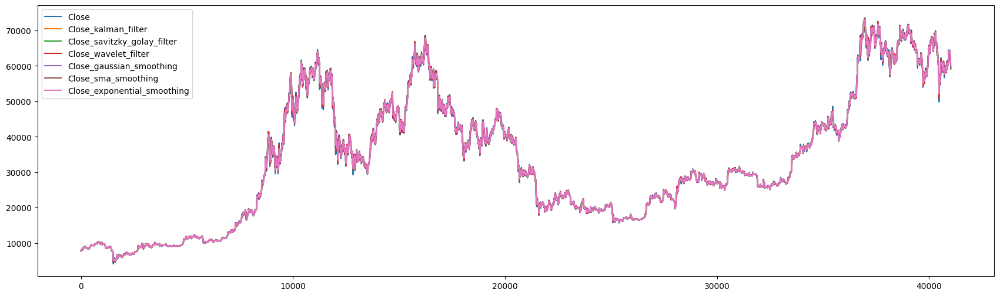

In [258]:
df_save[
    [
        "Close", 
        "Close_kalman_filter",
        "Close_savitzky_golay_filter",
        "Close_wavelet_filter",
        "Close_gaussian_smoothing",
        "Close_sma_smoothing",
        "Close_exponential_smoothing",
    ]
].plot(figsize=(21, 6))

<Axes: >

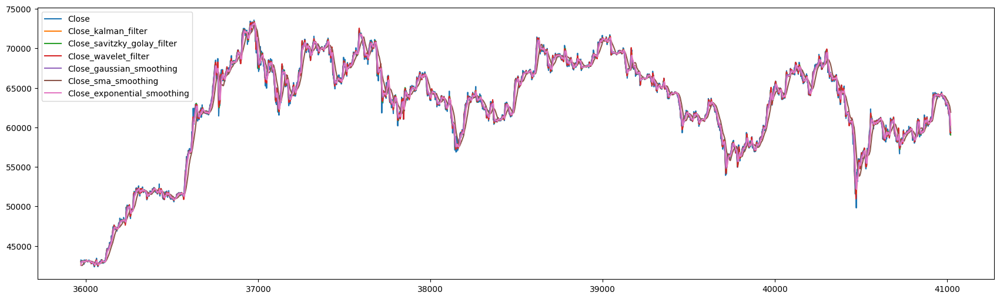

In [259]:
df_save[
    [
        "Close", 
        "Close_kalman_filter",
        "Close_savitzky_golay_filter",
        "Close_wavelet_filter",
        "Close_gaussian_smoothing",
        "Close_sma_smoothing",
        "Close_exponential_smoothing",
    ]
].iloc[-5000:].plot(figsize=(21, 6))

<Axes: >

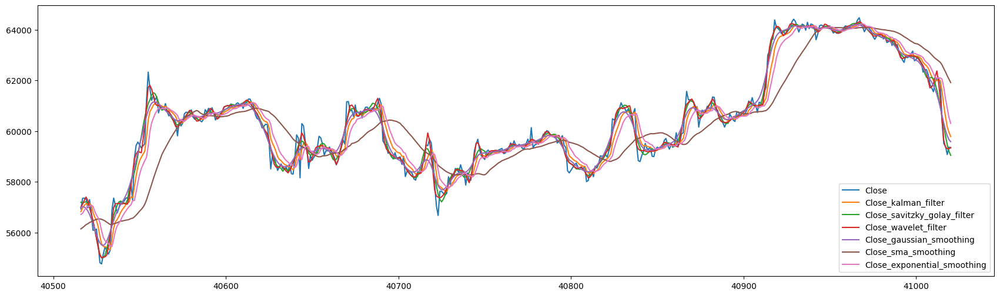

In [260]:
df_save[
    [
        "Close", 
        "Close_kalman_filter",
        "Close_savitzky_golay_filter",
        "Close_wavelet_filter",
        "Close_gaussian_smoothing",
        "Close_sma_smoothing",
        "Close_exponential_smoothing",
    ]
].iloc[-500:].plot(figsize=(21, 6))

In [261]:
# Отключение warning-ов
with pd.option_context('mode.chained_assignment', None):
    rsi_signals = rsi_signal(df_save)
    df_save["RSI_buy_signal"] = rsi_signals[0]
    df_save["RSI_sell_signal"] = rsi_signals[1]
    
    bbands_signals = bbands_signal(df_save)
    df_save["BBANDS_buy_signal"] = bbands_signals[0]
    df_save["BBANDS_sell_signal"] = bbands_signals[1]
    
    macd_signals = macd_signal(df_save)
    df_save["MACD_buy_signal"] = macd_signals[0]
    df_save["MACD_sell_signal"] = macd_signals[1]
    
    ppo_signals = ppo_signal(df_save)
    df_save["PPO_buy_signal"] = ppo_signals[0]
    df_save["PPO_sell_signal"] = ppo_signals[1]
    
    adx_signals = adx_signal(df_save)
    df_save["ADX_buy_signal"] = adx_signals[0]
    df_save["ADX_sell_signal"] = adx_signals[1]

In [262]:
df_save.head()

,Date,Open,High,Low,Close,Volume,Close_kalman_filter,Close_savitzky_golay_filter,Close_wavelet_filter,Close_gaussian_smoothing,...,RSI_buy_signal,RSI_sell_signal,BBANDS_buy_signal,BBANDS_sell_signal,MACD_buy_signal,MACD_sell_signal,PPO_buy_signal,PPO_sell_signal,ADX_buy_signal,ADX_sell_signal
0,2020-01-10 00:00:00,7820.1,7855.0,7820.0,7822.5,664.211164,7822.500000,7831.197094,7809.945216,7801.472330,...,False,False,False,False,False,False,False,False,False,False
1,2020-01-10 01:00:00,7821.6,7841.0,7789.5,7804.9,678.947848,7813.284941,7818.135310,7816.715159,7799.048737,...,False,False,False,False,False,False,False,False,False,False
2,2020-01-10 02:00:00,7805.6,7824.8,7795.0,7803.2,459.759148,7809.411534,7801.281293,7822.369027,7794.513746,...,False,False,False,False,False,False,False,False,False,False
3,2020-01-10 03:00:00,7803.1,7822.4,7770.7,7817.3,859.317567,7811.984603,7783.585287,7804.902741,7788.522530,...,False,False,False,False,False,False,False,False,False,False
4,2020-01-10 04:00:00,7817.4,7817.8,7750.0,7795.2,1710.733039,7806.968914,7767.549133,7781.272813,7782.138662,...,False,False,False,False,False,False,False,False,False,False


# Сохранение данных в InfluxDB

In [263]:
from influxdb_client import InfluxDBClient
from influxdb_client.rest import ApiException
from influxdb_client.client.write_api import SYNCHRONOUS

In [264]:
url = "http://influxdb:8086"  
token = os.getenv('INFLUXDB_INIT_ADMIN_TOKEN')          
org = os.getenv('INFLUXDB_INIT_ORG')               

client = InfluxDBClient(url=url, token=token, org=org)

In [265]:
bucket_name = 'btc-usdt-bucket'
measurement_name = '1h-timeframe'

## Создание бакета

In [266]:
try:
    bucket = client.buckets_api().create_bucket(
        org_id=org,
        bucket_name=bucket_name,
        description="Данные BTC/USDT"
    )
    print(f"Бакет '{bucket.name}' успешно создан")
except ApiException:
    print(f"Бакет '{bucket_name}' уже существует")

Бакет 'btc-usdt-bucket' успешно создан


## Запись части данных в бакет

In [267]:
write_api = client.write_api(write_options=SYNCHRONOUS)

In [268]:
write_api.write(
    bucket=bucket_name,
    record=df_save,
    data_frame_measurement_name=measurement_name,
    data_frame_timestamp_column="Date",
)

## Имитация инкрементальной записи

In [269]:
query_api = client.query_api()

### Получаем последнюю временную метку записи информации

In [270]:
check_query = f'''
from(bucket:"{bucket_name}")
  |> range(start: -inf)
  |> filter(fn: (r) => r["_measurement"] == "{measurement_name}")
  |> last()
  |> pivot(rowKey: ["_time"], columnKey: ["_field"], valueColumn: "_value")
'''

result = query_api.query_data_frame(check_query)

In [271]:
result["_time"]

0   2024-08-28 02:00:00+00:00
Name: _time, dtype: datetime64[ns, UTC]

In [272]:
df_save.iloc[-1]["Date"]

Timestamp('2024-08-28 02:00:00')

### Получаем 299 последних точек из БД

In [273]:
LAST_CLOSE_POINT_COUNT = 299

In [274]:
start_query_time = result["_time"].copy() - pd.Timedelta(hours=299-1)
start_query_time = start_query_time[0]
start_query_time = start_query_time.isoformat()

In [275]:
start_query_time

'2024-08-15T16:00:00+00:00'

In [276]:
last_data_query = f'''
from(bucket:"{bucket_name}")
  |> range(start: {start_query_time})
  |> filter(fn: (r) => r["_measurement"] == "{measurement_name}")
  |> filter(fn: (r) => r["_field"] == "Close" or r["_field"] == "Open" or r["_field"] == "Low" or r["_field"] == "High" or r["_field"] == "Volume")
  |> limit(n: {LAST_CLOSE_POINT_COUNT})
  |> pivot(rowKey: ["_time"], columnKey: ["_field"], valueColumn: "_value")
'''

In [277]:
last_data_df = query_api.query_data_frame(last_data_query)
last_data_df = last_data_df[["_time", "Open", "High", "Low", "Close", "Volume"]]
last_data_df = last_data_df.rename(columns={"_time": "Date"})

In [278]:
last_data_df

,Date,Open,High,Low,Close,Volume
0,2024-08-15 16:00:00+00:00,59676.0,59850.0,59435.1,59536.7,331.866856
1,2024-08-15 17:00:00+00:00,59536.7,59551.2,58788.1,58870.0,394.200047
2,2024-08-15 18:00:00+00:00,58876.0,58876.1,57525.1,57872.2,1064.362316
3,2024-08-15 19:00:00+00:00,57867.1,57957.3,56678.0,57046.6,1258.972721
4,2024-08-15 20:00:00+00:00,57044.1,57134.7,56093.7,56667.9,789.952083
...,...,...,...,...,...,...
294,2024-08-27 22:00:00+00:00,60415.3,60418.0,58000.0,59503.9,2444.862184
295,2024-08-27 23:00:00+00:00,59499.0,59770.9,59146.0,59404.8,616.796666
296,2024-08-28 00:00:00+00:00,59406.9,59446.7,58986.0,59074.0,680.380985
297,2024-08-28 01:00:00+00:00,59077.9,59447.0,58911.5,59367.8,479.006397


### Добавление новой точки данных

In [279]:
df_for_calculations = pd.concat([last_data_df, df_test.iloc[0].to_frame().T], axis=0)
df_for_calculations = df_for_calculations.reset_index(drop=True)

In [280]:
df_for_calculations

,Date,Open,High,Low,Close,Volume
0,2024-08-15 16:00:00+00:00,59676.0,59850.0,59435.1,59536.7,331.866856
1,2024-08-15 17:00:00+00:00,59536.7,59551.2,58788.1,58870.0,394.200047
2,2024-08-15 18:00:00+00:00,58876.0,58876.1,57525.1,57872.2,1064.362316
3,2024-08-15 19:00:00+00:00,57867.1,57957.3,56678.0,57046.6,1258.972721
4,2024-08-15 20:00:00+00:00,57044.1,57134.7,56093.7,56667.9,789.952083
...,...,...,...,...,...,...
295,2024-08-27 23:00:00+00:00,59499.0,59770.9,59146.0,59404.8,616.796666
296,2024-08-28 00:00:00+00:00,59406.9,59446.7,58986.0,59074.0,680.380985
297,2024-08-28 01:00:00+00:00,59077.9,59447.0,58911.5,59367.8,479.006397
298,2024-08-28 02:00:00+00:00,59367.8,59416.6,59194.9,59334.9,201.815734


In [281]:
df_for_calculations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Date    300 non-null    object
 1   Open    300 non-null    object
 2   High    300 non-null    object
 3   Low     300 non-null    object
 4   Close   300 non-null    object
 5   Volume  300 non-null    object
dtypes: object(6)
memory usage: 14.2+ KB


Приводим DataFrame к нужным форматам данных

In [282]:
df_for_calculations['Date'] = pd.to_datetime(df_for_calculations['Date'], utc=True)
numeric_columns = ['Open', 'High', 'Low', 'Close', 'Volume']
for col in numeric_columns:
    df_for_calculations[col] = pd.to_numeric(df_for_calculations[col], errors='coerce')

In [283]:
df_for_calculations

,Date,Open,High,Low,Close,Volume
0,2024-08-15 16:00:00+00:00,59676.0,59850.0,59435.1,59536.7,331.866856
1,2024-08-15 17:00:00+00:00,59536.7,59551.2,58788.1,58870.0,394.200047
2,2024-08-15 18:00:00+00:00,58876.0,58876.1,57525.1,57872.2,1064.362316
3,2024-08-15 19:00:00+00:00,57867.1,57957.3,56678.0,57046.6,1258.972721
4,2024-08-15 20:00:00+00:00,57044.1,57134.7,56093.7,56667.9,789.952083
...,...,...,...,...,...,...
295,2024-08-27 23:00:00+00:00,59499.0,59770.9,59146.0,59404.8,616.796666
296,2024-08-28 00:00:00+00:00,59406.9,59446.7,58986.0,59074.0,680.380985
297,2024-08-28 01:00:00+00:00,59077.9,59447.0,58911.5,59367.8,479.006397
298,2024-08-28 02:00:00+00:00,59367.8,59416.6,59194.9,59334.9,201.815734


In [284]:
df_for_calculations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype              
---  ------  --------------  -----              
 0   Date    300 non-null    datetime64[ns, UTC]
 1   Open    300 non-null    float64            
 2   High    300 non-null    float64            
 3   Low     300 non-null    float64            
 4   Close   300 non-null    float64            
 5   Volume  300 non-null    float64            
dtypes: datetime64[ns, UTC](1), float64(5)
memory usage: 14.2 KB


### Расчёт новых характеристик

In [285]:
# Отключение warning-ов
with pd.option_context('mode.chained_assignment', None):
    df_for_calculations["Close_kalman_filter"] = apply_kalman_filtering(df_for_calculations["Close"])
    df_for_calculations["Close_savitzky_golay_filter"] = apply_savitzky_golay_filtering(df_for_calculations["Close"])
    df_for_calculations["Close_wavelet_filter"] = apply_wavelet_filtering(df_for_calculations["Close"])
    df_for_calculations["Close_gaussian_smoothing"] = apply_gaussian_smoothing(df_for_calculations["Close"])
    df_for_calculations["Close_sma_smoothing"] = apply_sma_smoothing(df_for_calculations["Close"])
    df_for_calculations["Close_exponential_smoothing"] = apply_exponential_smoothing_smoothing(df_for_calculations["Close"])    

In [286]:
# Отключение warning-ов
with pd.option_context('mode.chained_assignment', None):
    rsi_signals = rsi_signal(df_for_calculations)
    df_for_calculations["RSI_buy_signal"] = rsi_signals[0]
    df_for_calculations["RSI_sell_signal"] = rsi_signals[1]
    
    bbands_signals = bbands_signal(df_for_calculations)
    df_for_calculations["BBANDS_buy_signal"] = bbands_signals[0]
    df_for_calculations["BBANDS_sell_signal"] = bbands_signals[1]
    
    macd_signals = macd_signal(df_for_calculations)
    df_for_calculations["MACD_buy_signal"] = macd_signals[0]
    df_for_calculations["MACD_sell_signal"] = macd_signals[1]
    
    ppo_signals = ppo_signal(df_for_calculations)
    df_for_calculations["PPO_buy_signal"] = ppo_signals[0]
    df_for_calculations["PPO_sell_signal"] = ppo_signals[1]
    
    adx_signals = adx_signal(df_for_calculations)
    df_for_calculations["ADX_buy_signal"] = adx_signals[0]
    df_for_calculations["ADX_sell_signal"] = adx_signals[1]

In [287]:
df_for_calculations

,Date,Open,High,Low,Close,Volume,Close_kalman_filter,Close_savitzky_golay_filter,Close_wavelet_filter,Close_gaussian_smoothing,...,RSI_buy_signal,RSI_sell_signal,BBANDS_buy_signal,BBANDS_sell_signal,MACD_buy_signal,MACD_sell_signal,PPO_buy_signal,PPO_sell_signal,ADX_buy_signal,ADX_sell_signal
0,2024-08-15 16:00:00+00:00,59676.0,59850.0,59435.1,59536.7,331.866856,59536.700000,59546.612343,58712.157178,58209.040832,...,False,False,False,False,False,False,False,False,False,False
1,2024-08-15 17:00:00+00:00,59536.7,59551.2,58788.1,58870.0,394.200047,59187.627275,58578.504574,58242.532199,58144.345074,...,False,False,False,False,False,False,False,False,False,False
2,2024-08-15 18:00:00+00:00,58876.0,58876.1,57525.1,57872.2,1064.362316,58682.400249,57905.464751,57767.098738,58032.781782,...,False,False,False,False,False,False,False,False,False,False
3,2024-08-15 19:00:00+00:00,57867.1,57957.3,56678.0,57046.6,1258.972721,58148.833141,57477.168573,57563.492843,57903.398275,...,False,False,False,False,False,False,False,False,False,False
4,2024-08-15 20:00:00+00:00,57044.1,57134.7,56093.7,56667.9,789.952083,57706.290673,57247.258721,57480.891054,57786.643866,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,2024-08-27 23:00:00+00:00,59499.0,59770.9,59146.0,59404.8,616.796666,60574.225913,59709.039533,59351.439132,60064.261188,...,False,False,False,False,False,False,False,False,False,False
296,2024-08-28 00:00:00+00:00,59406.9,59446.7,58986.0,59074.0,680.380985,60168.930563,59394.285815,59343.212566,59843.167547,...,False,False,False,False,False,False,False,False,False,False
297,2024-08-28 01:00:00+00:00,59077.9,59447.0,58911.5,59367.8,479.006397,59952.500165,59217.126098,59412.636664,59680.504064,...,False,False,False,False,False,False,False,False,False,False
298,2024-08-28 02:00:00+00:00,59367.8,59416.6,59194.9,59334.9,201.815734,59785.651644,59241.201110,59540.347853,59576.638676,...,False,False,False,False,False,False,False,False,False,False


### Сохранение новой точки данных в БД

In [288]:
write_api.write(
    bucket=bucket_name,
    record=df_for_calculations.iloc[-1:],
    data_frame_measurement_name=measurement_name,
    data_frame_timestamp_column="Date",
)

In [289]:
check_query = f'''
from(bucket:"{bucket_name}")
  |> range(start: -inf)
  |> filter(fn: (r) => r["_measurement"] == "{measurement_name}")
  |> last()
  |> pivot(rowKey: ["_time"], columnKey: ["_field"], valueColumn: "_value")
'''

result = query_api.query_data_frame(check_query)

In [290]:
result["_time"]

0   2024-08-28 03:00:00+00:00
Name: _time, dtype: datetime64[ns, UTC]

### Реализация цикла

In [291]:
def get_latest_datetime_from_db(query_api, bucket_name, measurement_name):
    last_date_query = f'''
    from(bucket:"{bucket_name}")
      |> range(start: -inf)
      |> filter(fn: (r) => r["_measurement"] == "{measurement_name}")
      |> last()
      |> pivot(rowKey: ["_time"], columnKey: ["_field"], valueColumn: "_value")
    '''

    last_datetime = query_api.query_data_frame(last_date_query)

    start_query_datetime = last_datetime["_time"].copy() - pd.Timedelta(hours=299-1)
    start_query_datetime = start_query_datetime[0]
    start_query_datetime = start_query_datetime.isoformat()

    return start_query_datetime

In [292]:
def get_latest_data_from_db(query_api, bucket_name, start_query_datetime, measurement_name, LAST_CLOSE_POINT_COUNT=300):
    last_data_query = f'''
    from(bucket:"{bucket_name}")
      |> range(start: {start_query_datetime})
      |> filter(fn: (r) => r["_measurement"] == "{measurement_name}")
      |> filter(fn: (r) => r["_field"] == "Close" or r["_field"] == "Open" or r["_field"] == "Low" or r["_field"] == "High" or r["_field"] == "Volume")
      |> limit(n: {LAST_CLOSE_POINT_COUNT})
      |> pivot(rowKey: ["_time"], columnKey: ["_field"], valueColumn: "_value")
    '''
    
    last_data_df = query_api.query_data_frame(last_data_query)
    last_data_df = last_data_df[["_time", "Open", "High", "Low", "Close", "Volume"]]
    last_data_df = last_data_df.rename(columns={"_time": "Date"})

    return last_data_df

In [293]:
def merge_data(last_data_df, df_new):
    df_for_calculations = pd.concat([last_data_df, df_new], axis=0)
    df_for_calculations = df_for_calculations.reset_index(drop=True)
    df_for_calculations['Date'] = pd.to_datetime(df_for_calculations['Date'], utc=True)
    numeric_columns = ['Open', 'High', 'Low', 'Close', 'Volume']
    for col in numeric_columns:
        df_for_calculations[col] = pd.to_numeric(df_for_calculations[col], errors='coerce')

    return df_for_calculations

In [294]:
def calculate_all_close_smoothings(df_for_calculations):
    # Отключение warning-ов
    with pd.option_context('mode.chained_assignment', None):
        df_for_calculations["Close_kalman_filter"] = apply_kalman_filtering(df_for_calculations["Close"])
        df_for_calculations["Close_savitzky_golay_filter"] = apply_savitzky_golay_filtering(df_for_calculations["Close"])
        df_for_calculations["Close_wavelet_filter"] = apply_wavelet_filtering(df_for_calculations["Close"])
        df_for_calculations["Close_gaussian_smoothing"] = apply_gaussian_smoothing(df_for_calculations["Close"])
        df_for_calculations["Close_sma_smoothing"] = apply_sma_smoothing(df_for_calculations["Close"])
        df_for_calculations["Close_exponential_smoothing"] = apply_exponential_smoothing_smoothing(df_for_calculations["Close"])

    return df_for_calculations

In [295]:
def calculate_all_signals(df_for_calculations):
    # Отключение warning-ов
    with pd.option_context('mode.chained_assignment', None):
        rsi_signals = rsi_signal(df_for_calculations)
        df_for_calculations["RSI_buy_signal"] = rsi_signals[0]
        df_for_calculations["RSI_sell_signal"] = rsi_signals[1]
        
        bbands_signals = bbands_signal(df_for_calculations)
        df_for_calculations["BBANDS_buy_signal"] = bbands_signals[0]
        df_for_calculations["BBANDS_sell_signal"] = bbands_signals[1]
        
        macd_signals = macd_signal(df_for_calculations)
        df_for_calculations["MACD_buy_signal"] = macd_signals[0]
        df_for_calculations["MACD_sell_signal"] = macd_signals[1]
        
        ppo_signals = ppo_signal(df_for_calculations)
        df_for_calculations["PPO_buy_signal"] = ppo_signals[0]
        df_for_calculations["PPO_sell_signal"] = ppo_signals[1]
        
        adx_signals = adx_signal(df_for_calculations)
        df_for_calculations["ADX_buy_signal"] = adx_signals[0]
        df_for_calculations["ADX_sell_signal"] = adx_signals[1]

    return df_for_calculations    

In [296]:
def write_new_data_in_db(write_api, bucket_name, df_for_calculations, measurement_name):
    write_api.write(
        bucket=bucket_name,
        record=df_for_calculations.iloc[-1:],
        data_frame_measurement_name=measurement_name,
        data_frame_timestamp_column="Date",
    )

In [297]:
for idx in tqdm.tqdm(range(1, df_test.shape[0])):
    # Получение последней временной метки
    latest_datetime = get_latest_datetime_from_db(query_api, bucket_name, measurement_name)

    # Получаем последние 300-1 точек данных
    latest_df_from_db = get_latest_data_from_db(query_api, bucket_name, latest_datetime, measurement_name)

    # К этим точкам прибавляем новую информацию
    df_new = df_test.iloc[idx].to_frame().T
    df_concated = merge_data(latest_df_from_db, df_new)

    # Добавляем новые close фичи
    df_concated = calculate_all_close_smoothings(df_concated)

    # Добавляем фичи сигналов
    df_concated = calculate_all_signals(df_concated)

    # Запись данных в БД
    write_new_data_in_db(write_api, bucket_name, df_concated, measurement_name)

100%|██████████| 999/999 [01:23<00:00, 11.92it/s]
